In [17]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import pickle as pkl
import gc
import lightgbm as lgbm
from lightgbm import LGBMRegressor
import sklearn
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action = 'ignore', category = FutureWarning)
import joblib
import re
import os

In [18]:
print(lgbm.__version__)

4.1.0


In [19]:
sales = pd.read_csv('C:/Users/Dr Nabil/Desktop/Swapnil_BTP/m5-forecasting-accuracy/sales_train_evaluation.csv')
calendar = pd.read_csv('C:/Users/Dr Nabil/Desktop/Swapnil_BTP/m5-forecasting-accuracy/calendar.csv')
prices = pd.read_csv('C:/Users/Dr Nabil/Desktop/Swapnil_BTP/m5-forecasting-accuracy/sell_prices.csv')
sales

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,4,0,0,0,0,3,3,0,1
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,1,2,1,1,0,0,0,0,0
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,2,0,0,0,2,3,0,1
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,1,0,4,0,1,3,0,2,6
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,2,1,0,0,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,FOODS_3_823_WI_3_evaluation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,0,0,2,2,...,1,0,3,0,1,1,0,0,1,1
30486,FOODS_3_824_WI_3_evaluation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
30487,FOODS_3_825_WI_3_evaluation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,0,6,0,2,...,0,0,1,2,0,1,0,1,0,2
30488,FOODS_3_826_WI_3_evaluation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,1,1,1,4,6,0,1,1,1,0


Considering the training from d_1 to d_1913 and validation for d_1914 to d_1941 and testing for d_1942 to d_1969.

In [20]:
# add zero sales for the remaining days d_1942 to d_1969.
for i in range (1942,1970):
    col = 'd_' + str(i)
    sales[col] = 0
    sales[col] = sales[col].astype(np.int16) # from float to np.int16 to reduce the memory size.


# Downcasting 
Convert the float into int. Object into category or if Date and time is stored as the date and time then the converting it into the Date and Time dtype.

In [21]:
sales_bd = np.round(sales.memory_usage().sum()/(1024*1024),1)
calendar_bd = np.round(calendar.memory_usage().sum()/(1024*1024),1)
prices_bd = np.round(prices.memory_usage().sum()/(1024*1024),1)

In [22]:
def downcast(df):
    cols = df.dtypes.index.tolist()
    types = df.dtypes.values.tolist()
    for i,t in enumerate(types):
        print(t)
        if 'int' in str(t): #iterates over the index i and t as the values in the types list.
            if df[cols[i]].min() > np.iinfo(np.int8).min and df[cols[i]].max() < np.iinfo(np.int8).max: # checking whether the columns with the integer values are within  the range of np.intx. If that's
                # then we are converting that data type into np.intx.
                df[cols[i]] = df[cols[i]].astype(np.int8)
            elif df[cols[i]].min() > np.iinfo(np.int16).min and df[cols[i]].max() < np.iinfo(np.int16).max:
                df[cols[i]] = df[cols[i]].astype(np.int16)
            elif df[cols[i]].min() > np.iinfo(np.int32).min and df[cols[i]].max() < np.iinfo(np.int32).max:
                df[cols[i]] = df[cols[i]].astype(np.int32)
            else:
                df[cols[i]] = df[cols[i]].astype(np.int64)
        elif 'float' in str(t): # checking whether the columns with the float values are within  the range of np.floatx. If that's then we are converting that data type into np.floatx.
            if df[cols[i]].min() > np.finfo(np.float16).min and df[cols[i]].max() < np.finfo(np.float16).max:
                df[cols[i]] = df[cols[i]].astype(np.float16)
            elif df[cols[i]].min() > np.finfo(np.float32).min and df[cols[i]].max() < np.finfo(np.float32).max:
                df[cols[i]] = df[cols[i]].astype(np.float32)
            else:
                df[cols[i]] = df[cols[i]].astype(np.float64)
        elif t == object : # converting date object into date and time dtype or else category.
            if cols[i] == 'date':
                df[cols[i]] = pd.to_datetime(df[cols[i]], format='%Y-%m-%d')
            else:
                df[cols[i]] = df[cols[i]].astype('category')
    return df  

sales = downcast(sales)
prices = downcast(prices)
calendar = downcast(calendar)

object
object
object
object
object
object
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int6

In [23]:
sales_ad = np.round(sales.memory_usage().sum()/(1024*1024),1)
calendar_ad = np.round(calendar.memory_usage().sum()/(1024*1024),1)
prices_ad = np.round(prices.memory_usage().sum()/(1024*1024),1)
dic = {'DataFrame':['sales','calendar','prices'],
       'Before downcasting':[sales_bd,calendar_bd,prices_bd],
       'After downcasting':[sales_ad,calendar_ad,prices_ad]}

memory = pd.DataFrame(dic)
memory = pd.melt(memory, id_vars='DataFrame', var_name='Status', value_name='Memory (MB)')
memory.sort_values('Memory (MB)',inplace=True)
fig = px.bar(memory, x='DataFrame', y='Memory (MB)', color='Status', barmode='group', text='Memory (MB)')
fig.update_traces(texttemplate='%{text} MB', textposition='outside')
fig.update_layout(template='seaborn', title='Effect of Downcasting')
fig.show()

# Melting the data.

In [24]:
df = pd.melt(sales, id_vars=['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'], var_name='d', value_name='sold').dropna()
df[df['id'] =='HOBBIES_1_001_CA_1_evaluation' ]

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
30490,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_2,0
60980,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_3,0
91470,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_4,0
121960,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_5,0
...,...,...,...,...,...,...,...,...
59882360,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1965,0
59912850,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1966,0
59943340,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1967,0
59973830,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1968,0


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60034810 entries, 0 to 60034809
Data columns (total 8 columns):
 #   Column    Dtype   
---  ------    -----   
 0   id        category
 1   item_id   category
 2   dept_id   category
 3   cat_id    category
 4   store_id  category
 5   state_id  category
 6   d         object  
 7   sold      int16   
dtypes: category(6), int16(1), object(1)
memory usage: 1.0+ GB


In [26]:
df['id'].unique()

['HOBBIES_1_001_CA_1_evaluation', 'HOBBIES_1_002_CA_1_evaluation', 'HOBBIES_1_003_CA_1_evaluation', 'HOBBIES_1_004_CA_1_evaluation', 'HOBBIES_1_005_CA_1_evaluation', ..., 'FOODS_3_823_WI_3_evaluation', 'FOODS_3_824_WI_3_evaluation', 'FOODS_3_825_WI_3_evaluation', 'FOODS_3_826_WI_3_evaluation', 'FOODS_3_827_WI_3_evaluation']
Length: 30490
Categories (30490, object): ['FOODS_1_001_CA_1_evaluation', 'FOODS_1_001_CA_2_evaluation', 'FOODS_1_001_CA_3_evaluation', 'FOODS_1_001_CA_4_evaluation', ..., 'HOUSEHOLD_2_516_TX_3_evaluation', 'HOUSEHOLD_2_516_WI_1_evaluation', 'HOUSEHOLD_2_516_WI_2_evaluation', 'HOUSEHOLD_2_516_WI_3_evaluation']

In [27]:
state_filter = 'CA'
store_filter = 'CA_1'
id_filter = 'HOBBIES_1_003_CA_1_evaluation'
dept_id_filter = 'HOBBIES_1'
cat_id_filter = 'HOBBIES'
item_id_filter = 'HOBBIES_1_003'
filtered_df = df[(df['store_id']==store_filter) & (df['state_id']== state_filter) & (df['cat_id'] == cat_id_filter) & (df['id']== id_filter) & (df['dept_id'] == dept_id_filter) & (df['item_id'] ==item_id_filter)]

In [28]:
fig = px.line(filtered_df, x = 'd',y = 'sold', title = 'Sales over time', labels = {'d':'Date', 'sold':'Sold Quantity'}, line_group= 'id', color = 'id')
fig.show()

In [29]:
prices

,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.578125
1,CA_1,HOBBIES_1_001,11326,9.578125
2,CA_1,HOBBIES_1_001,11327,8.257812
3,CA_1,HOBBIES_1_001,11328,8.257812
4,CA_1,HOBBIES_1_001,11329,8.257812
...,...,...,...,...
6841116,WI_3,FOODS_3_827,11617,1.000000
6841117,WI_3,FOODS_3_827,11618,1.000000
6841118,WI_3,FOODS_3_827,11619,1.000000
6841119,WI_3,FOODS_3_827,11620,1.000000


In [30]:
df = pd.merge(df, calendar, on='d', how='left')
df = pd.merge(df, prices, on=['store_id','item_id','wm_yr_wk'], how='left') 
df
#30490*1969 is 60034810

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,date,wm_yr_wk,...,month,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,sell_price
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60034805,FOODS_3_823_WI_3_evaluation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,d_1969,0,2016-06-19,11621,...,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,2.980469
60034806,FOODS_3_824_WI_3_evaluation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,d_1969,0,2016-06-19,11621,...,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,2.480469
60034807,FOODS_3_825_WI_3_evaluation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,d_1969,0,2016-06-19,11621,...,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,3.980469
60034808,FOODS_3_826_WI_3_evaluation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,d_1969,0,2016-06-19,11621,...,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,1.280273


In [31]:
df[df['sell_price'].isna()]

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,date,wm_yr_wk,...,month,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,sell_price
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56108534,HOUSEHOLD_1_278_CA_3_evaluation,HOUSEHOLD_1_278,HOUSEHOLD_1,HOUSEHOLD,CA_3,CA,d_1841,0,2016-02-12,11602,...,2,2016,NaN,NaN,NaN,NaN,0,1,1,NaN
56110517,FOODS_3_595_CA_3_evaluation,FOODS_3_595,FOODS_3,FOODS,CA_3,CA,d_1841,0,2016-02-12,11602,...,2,2016,NaN,NaN,NaN,NaN,0,1,1,NaN
56111702,HOUSEHOLD_1_400_CA_4_evaluation,HOUSEHOLD_1_400,HOUSEHOLD_1,HOUSEHOLD,CA_4,CA,d_1841,0,2016-02-12,11602,...,2,2016,NaN,NaN,NaN,NaN,0,1,1,NaN
56123886,HOUSEHOLD_1_386_WI_1_evaluation,HOUSEHOLD_1_386,HOUSEHOLD_1,HOUSEHOLD,WI_1,WI,d_1841,0,2016-02-12,11602,...,2,2016,NaN,NaN,NaN,NaN,0,1,1,NaN


In [32]:
(df[df['sell_price'].isna()]['sold']!=0).sum() # as the sell price is NaN only for the SKU having NaN values so it is better to replace the NaN value with zero to make the new feature revenue.

0

In [33]:
values = {'sell_price':0}
df = df.fillna(value=values)
df

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,date,wm_yr_wk,...,month,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,sell_price
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,0.000000
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,0.000000
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,0.000000
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,0.000000
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60034805,FOODS_3_823_WI_3_evaluation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,d_1969,0,2016-06-19,11621,...,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,2.980469
60034806,FOODS_3_824_WI_3_evaluation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,d_1969,0,2016-06-19,11621,...,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,2.480469
60034807,FOODS_3_825_WI_3_evaluation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,d_1969,0,2016-06-19,11621,...,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,3.980469
60034808,FOODS_3_826_WI_3_evaluation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,d_1969,0,2016-06-19,11621,...,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,1.280273


# Label Encoding

In [34]:
print(df.id)
print(df.id.cat.codes) # will give you the different codes for the different id i.e. will do the label encoding.

0           HOBBIES_1_001_CA_1_evaluation
1           HOBBIES_1_002_CA_1_evaluation
2           HOBBIES_1_003_CA_1_evaluation
3           HOBBIES_1_004_CA_1_evaluation
4           HOBBIES_1_005_CA_1_evaluation
                        ...              
60034805      FOODS_3_823_WI_3_evaluation
60034806      FOODS_3_824_WI_3_evaluation
60034807      FOODS_3_825_WI_3_evaluation
60034808      FOODS_3_826_WI_3_evaluation
60034809      FOODS_3_827_WI_3_evaluation
Name: id, Length: 60034810, dtype: category
Categories (30490, object): ['FOODS_1_001_CA_1_evaluation', 'FOODS_1_001_CA_2_evaluation', 'FOODS_1_001_CA_3_evaluation', 'FOODS_1_001_CA_4_evaluation', ..., 'HOUSEHOLD_2_516_TX_3_evaluation', 'HOUSEHOLD_2_516_WI_1_evaluation', 'HOUSEHOLD_2_516_WI_2_evaluation', 'HOUSEHOLD_2_516_WI_3_evaluation']
0           14370
1           14380
2           14390
3           14400
4           14410
            ...  
60034805    14329
60034806    14339
60034807    14349
60034808    14359
60034809    1436

In [35]:
#Store the categories along with their codes
d_id = dict(zip(df.id.cat.codes, df.id))
d_item_id = dict(zip(df.item_id.cat.codes, df.item_id))
d_dept_id = dict(zip(df.dept_id.cat.codes, df.dept_id))
d_cat_id = dict(zip(df.cat_id.cat.codes, df.cat_id))
d_store_id = dict(zip(df.store_id.cat.codes, df.store_id))
d_state_id = dict(zip(df.state_id.cat.codes, df.state_id)) 

In [36]:
df.d = df['d'].apply(lambda x: x.split('_')[1]).astype(np.int16) # coverting d_1 to 1.
df

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,date,wm_yr_wk,...,month,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,sell_price
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,0.000000
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,0.000000
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,0.000000
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,0.000000
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60034805,FOODS_3_823_WI_3_evaluation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,1969,0,2016-06-19,11621,...,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,2.980469
60034806,FOODS_3_824_WI_3_evaluation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,1969,0,2016-06-19,11621,...,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,2.480469
60034807,FOODS_3_825_WI_3_evaluation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,1969,0,2016-06-19,11621,...,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,3.980469
60034808,FOODS_3_826_WI_3_evaluation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,1969,0,2016-06-19,11621,...,6,2016,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0,1.280273


In [37]:
cols = df.dtypes.index.tolist()
types = df.dtypes.values.tolist()
for i,type in enumerate(types):
    if type.name == 'category':
        df[cols[i]] = df[cols[i]].cat.codes # will assign the categorical values with NaN with -1
        
#3
df.drop('date',axis=1,inplace=True) # dropping the 'date' column.


In [38]:
df

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,wm_yr_wk,weekday,...,month,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,sell_price
0,14370,1437,3,1,0,0,1,0,11101,2,...,1,2011,-1,-1,-1,-1,0,0,0,0.000000
1,14380,1438,3,1,0,0,1,0,11101,2,...,1,2011,-1,-1,-1,-1,0,0,0,0.000000
2,14390,1439,3,1,0,0,1,0,11101,2,...,1,2011,-1,-1,-1,-1,0,0,0,0.000000
3,14400,1440,3,1,0,0,1,0,11101,2,...,1,2011,-1,-1,-1,-1,0,0,0,0.000000
4,14410,1441,3,1,0,0,1,0,11101,2,...,1,2011,-1,-1,-1,-1,0,0,0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60034805,14329,1432,2,0,9,2,1969,0,11621,3,...,6,2016,16,3,2,0,0,0,0,2.980469
60034806,14339,1433,2,0,9,2,1969,0,11621,3,...,6,2016,16,3,2,0,0,0,0,2.480469
60034807,14349,1434,2,0,9,2,1969,0,11621,3,...,6,2016,16,3,2,0,0,0,0,3.980469
60034808,14359,1435,2,0,9,2,1969,0,11621,3,...,6,2016,16,3,2,0,0,0,0,1.280273


# Introducing the lags.

In [39]:
lags = [1,2,3,6,12,24,36]
for lag in lags:
    df['sold_lag_'+str(lag)] = df.groupby(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'],as_index=False)['sold'].shift(lag).astype(np.float16)
df

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,wm_yr_wk,weekday,...,snap_TX,snap_WI,sell_price,sold_lag_1,sold_lag_2,sold_lag_3,sold_lag_6,sold_lag_12,sold_lag_24,sold_lag_36
0,14370,1437,3,1,0,0,1,0,11101,2,...,0,0,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,14380,1438,3,1,0,0,1,0,11101,2,...,0,0,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,14390,1439,3,1,0,0,1,0,11101,2,...,0,0,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,14400,1440,3,1,0,0,1,0,11101,2,...,0,0,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,14410,1441,3,1,0,0,1,0,11101,2,...,0,0,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60034805,14329,1432,2,0,9,2,1969,0,11621,3,...,0,0,2.980469,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60034806,14339,1433,2,0,9,2,1969,0,11621,3,...,0,0,2.480469,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60034807,14349,1434,2,0,9,2,1969,0,11621,3,...,0,0,3.980469,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60034808,14359,1435,2,0,9,2,1969,0,11621,3,...,0,0,1.280273,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [40]:
# creating the revenue column
df['revenue'] = (df['sold'].values)*(df['sell_price'].values)

In [41]:
df

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,wm_yr_wk,weekday,...,snap_WI,sell_price,sold_lag_1,sold_lag_2,sold_lag_3,sold_lag_6,sold_lag_12,sold_lag_24,sold_lag_36,revenue
0,14370,1437,3,1,0,0,1,0,11101,2,...,0,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1,14380,1438,3,1,0,0,1,0,11101,2,...,0,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2,14390,1439,3,1,0,0,1,0,11101,2,...,0,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
3,14400,1440,3,1,0,0,1,0,11101,2,...,0,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
4,14410,1441,3,1,0,0,1,0,11101,2,...,0,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60034805,14329,1432,2,0,9,2,1969,0,11621,3,...,0,2.980469,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60034806,14339,1433,2,0,9,2,1969,0,11621,3,...,0,2.480469,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60034807,14349,1434,2,0,9,2,1969,0,11621,3,...,0,3.980469,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60034808,14359,1435,2,0,9,2,1969,0,11621,3,...,0,1.280273,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


# Mean Encoding

In [42]:
df['iteam_sold_avg'] = df.groupby('item_id')['sold'].transform('mean').astype(np.float16)
df['state_sold_avg'] = df.groupby('state_id')['sold'].transform('mean').astype(np.float16)
df['store_sold_avg'] = df.groupby('store_id')['sold'].transform('mean').astype(np.float16)
df['cat_sold_avg'] = df.groupby('cat_id')['sold'].transform('mean').astype(np.float16)
df['dept_sold_avg'] = df.groupby('dept_id')['sold'].transform('mean').astype(np.float16)
df['cat_dept_sold_avg'] = df.groupby(['cat_id','dept_id'])['sold'].transform('mean').astype(np.float16)
df['store_item_sold_avg'] = df.groupby(['store_id','item_id'])['sold'].transform('mean').astype(np.float16)
df['cat_item_sold_avg'] = df.groupby(['cat_id','item_id'])['sold'].transform('mean').astype(np.float16)
df['dept_item_sold_avg'] = df.groupby(['dept_id','item_id'])['sold'].transform('mean').astype(np.float16)
df['state_store_sold_avg'] = df.groupby(['state_id','store_id'])['sold'].transform('mean').astype(np.float16)
df['state_store_cat_sold_avg'] = df.groupby(['state_id','store_id','cat_id'])['sold'].transform('mean').astype(np.float16)
df['store_cat_dept_sold_avg'] = df.groupby(['store_id','cat_id','dept_id'])['sold'].transform('mean').astype(np.float16)

In [43]:
df[df['state_id']==1]['state_sold_avg']

12196       1.067383
12197       1.067383
12198       1.067383
12199       1.067383
12200       1.067383
              ...   
60025658    1.067383
60025659    1.067383
60025660    1.067383
60025661    1.067383
60025662    1.067383
Name: state_sold_avg, Length: 18010443, dtype: float16

In [44]:
# Rolling sold mean
df['rolling_sold_mean'] = df.groupby(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'])['sold'].transform(lambda x: x.rolling(window=7).mean()).astype(np.float16)

In [45]:
df['expanding_sold_mean'] = df.groupby(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'])['sold'].transform(lambda x: x.expanding(2).mean()).astype(np.float16)
# if we will use the expanding(1) then the first row with respect to above group by item ids will not be NaN.

In [46]:
state_filter = 0
store_filter = 0
id_filter = 14370
dept_id_filter = 3
cat_id_filter = 1
item_id_filter = 1437
x = df[(df['store_id']==store_filter) & (df['state_id']== state_filter) & (df['cat_id'] == cat_id_filter) & (df['id']== id_filter) & (df['dept_id'] == dept_id_filter) & (df['item_id'] ==item_id_filter)]
x.head(28)

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,wm_yr_wk,weekday,...,dept_sold_avg,cat_dept_sold_avg,store_item_sold_avg,cat_item_sold_avg,dept_item_sold_avg,state_store_sold_avg,state_store_cat_sold_avg,store_cat_dept_sold_avg,rolling_sold_mean,expanding_sold_mean
0,14370,1437,3,1,0,0,1,0,11101,2,...,0.695801,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,NaN,NaN
30490,14370,1437,3,1,0,0,2,0,11101,3,...,0.695801,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,NaN,0.0
60980,14370,1437,3,1,0,0,3,0,11101,1,...,0.695801,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,NaN,0.0
91470,14370,1437,3,1,0,0,4,0,11101,5,...,0.695801,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,NaN,0.0
121960,14370,1437,3,1,0,0,5,0,11101,6,...,0.695801,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,NaN,0.0
152450,14370,1437,3,1,0,0,6,0,11101,4,...,0.695801,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,NaN,0.0
182940,14370,1437,3,1,0,0,7,0,11101,0,...,0.695801,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.0,0.0
213430,14370,1437,3,1,0,0,8,0,11102,2,...,0.695801,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.0,0.0
243920,14370,1437,3,1,0,0,9,0,11102,3,...,0.695801,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.0,0.0
274410,14370,1437,3,1,0,0,10,0,11102,1,...,0.695801,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.0,0.0


In [47]:
df['daily_avg_sold'] = df.groupby(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id','d'])['sold'].transform('mean').astype(np.float16) # daily average sold will have the same values as the sold.
df['avg_sold'] = df.groupby(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'])['sold'].transform('mean').astype(np.float16) # for the same groupby index we will calculate the average from d_1 to d_1969.
df['selling_trend'] = (df['daily_avg_sold'] - df['avg_sold']).astype(np.float16) # deviation from the mean.
df.drop(['daily_avg_sold','avg_sold'],axis=1,inplace=True) # dropping the 'daily_avg_sold','avg_sold' columns.

In [48]:
state_filter = 0
store_filter = 0
id_filter = 14370
dept_id_filter = 3
cat_id_filter = 1
item_id_filter = 1437
# lets check for the sold not equal to 1.
x = df[(df['store_id']==store_filter) & (df['state_id']== state_filter) & (df['cat_id'] == cat_id_filter) & (df['id']== id_filter) & (df['dept_id'] == dept_id_filter) & (df['item_id'] ==item_id_filter) &(df['sold']!=0)]
x.head(15)

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,wm_yr_wk,weekday,...,cat_dept_sold_avg,store_item_sold_avg,cat_item_sold_avg,dept_item_sold_avg,state_store_sold_avg,state_store_cat_sold_avg,store_cat_dept_sold_avg,rolling_sold_mean,expanding_sold_mean,selling_trend
27471490,14370,1437,3,1,0,0,902,1,11325,4,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.142822,0.001109,0.678711
27928840,14370,1437,3,1,0,0,917,2,11327,0,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.285645,0.003271,1.678711
27989820,14370,1437,3,1,0,0,919,1,11328,3,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.428467,0.004353,0.678711
28020310,14370,1437,3,1,0,0,920,1,11328,1,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.571289,0.005436,0.678711
28203250,14370,1437,3,1,0,0,926,1,11329,3,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.285645,0.006481,0.678711
28233740,14370,1437,3,1,0,0,927,2,11329,1,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.428467,0.008629,1.678711
28264230,14370,1437,3,1,0,0,928,1,11329,5,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.571289,0.009697,0.678711
28325210,14370,1437,3,1,0,0,930,1,11329,4,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.714355,0.010750,0.678711
28355700,14370,1437,3,1,0,0,931,1,11329,0,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.856934,0.011818,0.678711
28477660,14370,1437,3,1,0,0,935,1,11330,5,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.428467,0.012833,0.678711


Save the data.

In [49]:
# now as the first 35 rows with respect to the same id, state_id, store_id, cat_id, item_id, dept_id will have null values as the maximum lags are 36 so we will remove those rows.
df = df[df['d']>=36] # this will remove the NaN values of the rolling sold mean and the expanding sold mean.

In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58967660 entries, 1067150 to 60034809
Data columns (total 44 columns):
 #   Column                    Dtype  
---  ------                    -----  
 0   id                        int16  
 1   item_id                   int16  
 2   dept_id                   int8   
 3   cat_id                    int8   
 4   store_id                  int8   
 5   state_id                  int8   
 6   d                         int16  
 7   sold                      int16  
 8   wm_yr_wk                  int16  
 9   weekday                   int8   
 10  wday                      int8   
 11  month                     int8   
 12  year                      int16  
 13  event_name_1              int8   
 14  event_type_1              int8   
 15  event_name_2              int8   
 16  event_type_2              int8   
 17  snap_CA                   int8   
 18  snap_TX                   int8   
 19  snap_WI                   int8   
 20  sell_price      

In [51]:
df.to_pickle('data.pkl')
del df

# Model and Prediction

In [52]:
data = pd.read_pickle('data.pkl')
valid = data[(data['d']>=1914) & (data['d']<1942)][['id','d','sold']] # valid data from d_1914 to d_1942 and using only 'id','d','sold'.
test = data[data['d']>=1942][['id','d','sold']] # test data from d_1942 to d_1969 and using only 'id','d','sold'.
eval_preds = test['sold'] # Predicted variable is sold. eval_preds['sold']  are havinng sold values as zero.
valid_preds = valid['sold'] # Predicted variable is sold.

In [53]:
eval_preds

59181090    0
59181091    0
59181092    0
59181093    0
59181094    0
           ..
60034805    0
60034806    0
60034807    0
60034808    0
60034809    0
Name: sold, Length: 853720, dtype: int16

In [54]:
warnings.filterwarnings("ignore", category=UserWarning, message="[LightGBM] \[Warning\] No further splits with positive gain, best gain: -inf")
warnings.filterwarnings("ignore", category=UserWarning, message="[LightGBM] \[Debug\] Trained a tree with leaves = 50 and depth = 8")
warnings.filterwarnings("ignore", category=UserWarning, message="[LightGBM] \[Debug\] Trained a tree with leaves = 50 and depth = 7")

In [55]:
stores = sales.store_id.cat.codes.unique().tolist() # plotting for different stores so obtaining the different codes for different stores. Can be understand easily in context of the Label Encoding.
for store in stores: # 10 stores
    df = data[data['store_id']==store]
    
    #Split the data
    X_train, y_train = df[df['d']<1914].drop('sold',axis=1), df[df['d']<1914]['sold'] # training from the d_1 to d_1913. X will have all features except sold and Y will only have sold.
    X_valid, y_valid = df[(df['d']>=1914) & (df['d']<1942)].drop('sold',axis=1), df[(df['d']>=1914) & (df['d']<1942)]['sold'] # validating from d_1914 to d_1942.
    X_test = df[df['d']>=1942].drop('sold',axis=1) # we dont have y_test so X_test from d_1942 to d_1969.
    
    #Train and validate using the LGBM regressor.
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        model = LGBMRegressor(
            n_estimators=1000, # 1000 Decision tress
            learning_rate=0.3, 
            subsample=0.8,
            colsample_bytree=0.8,
            max_depth=8, # with max depth = 8
            num_leaves=50, # maximum number of leaves in one tree = 50
            min_child_weight=300,
            verbose = 20,
            early_stopping_rounds = 20
        )
        print('*****Prediction for Store: {}*****'.format(d_store_id[store])) #.format will enter the value in {} and d_store_id is above where the label encoding is done.
        model.set_params(verbose = 20, early_stopping_rounds = 20)
        model.fit(X_train, y_train, eval_set=[(X_train,y_train),(X_valid,y_valid)],eval_metric='rmse')
        valid_preds[X_valid.index] = model.predict(X_valid) # savihg the predicted values in the valid_preds for validation set.
        eval_preds[X_test.index] = model.predict(X_test) # # savihg the predicted values in the test_preds for testing set.
        # save model
        filename = 'model'+str(d_store_id[store])+'.pkl' # saving the model for each store. There are total 10 lgbm models.
        joblib.dump(model, filename)
        del model, X_train, y_train, X_valid, y_valid
        gc.collect()

*****Prediction for Store: CA_1*****
[LightGBM] [Warning] early_stopping_round is set=20, early_stopping_rounds=20 will be ignored. Current value: early_stopping_round=20
[LightGBM] [Debug] Dataset::GetMultiBinFromSparseFeatures: sparse rate 0.729793
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.374758
[LightGBM] [Debug] init for col-wise cost 0.214918 seconds, init for row-wise cost 0.682133 seconds
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.269759 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Debug] Using Sparse Multi-Val Bin
[LightGBM] [Info] Total Bins 4041
[LightGBM] [Info] Number of data points in the train set: 5726022, number of used features: 41
[LightGBM] [Warning] early_stopping_round is set=20, early_stopping_rounds=20 will be ignored. Current value: early_stopping_round=20
[LightGBM] [Info] Start training from

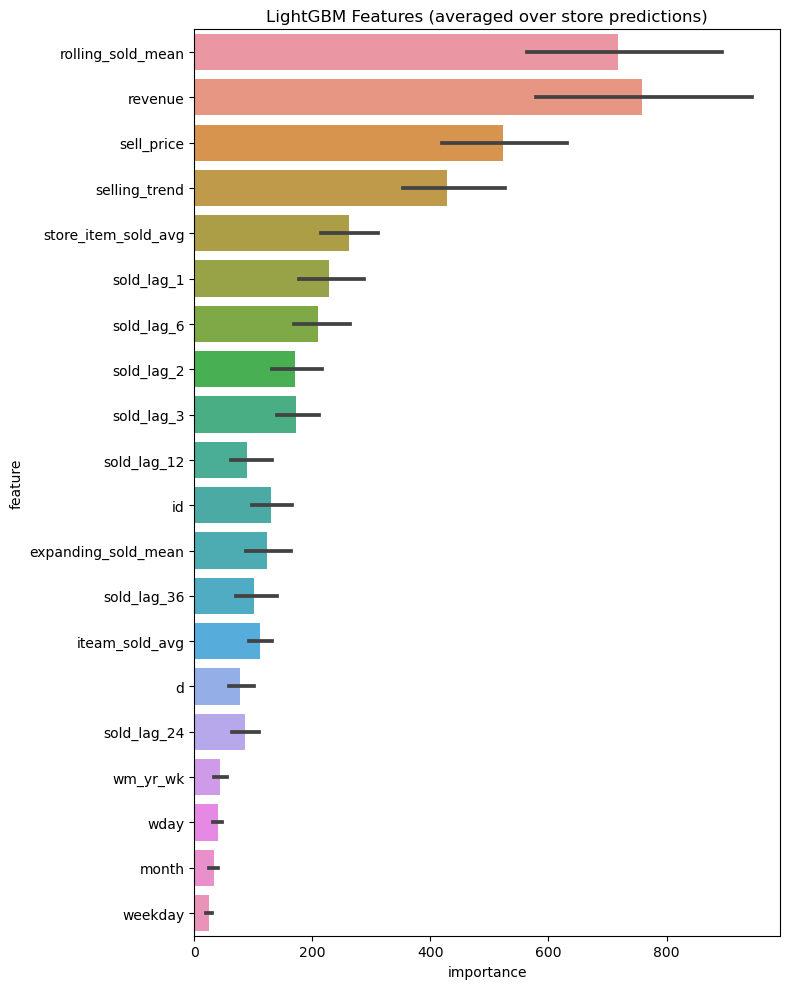

In [56]:
feature_importance_df = pd.DataFrame()
features = [f for f in data.columns if f != 'sold']
for filename in os.listdir('C:/Users/Dr Nabil/Desktop/Swapnil_BTP/PYTHON NOTEBOOKS'):
    if 'model' in filename:
        # load model
        model = joblib.load(filename)
        store_importance_df = pd.DataFrame()
        store_importance_df["feature"] = features
        store_importance_df["importance"] = model.feature_importances_
        store_importance_df["store"] = filename[5:9]
        feature_importance_df = pd.concat([feature_importance_df, store_importance_df], axis=0)
    
def display_importances(feature_importance_df_):
    cols = feature_importance_df_[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)[:20].index
    best_features = feature_importance_df_.loc[feature_importance_df_.feature.isin(cols)]
    plt.figure(figsize=(8, 10))
    sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False))
    plt.title('LightGBM Features (averaged over store predictions)')
    plt.tight_layout()
    
display_importances(feature_importance_df)

In [57]:
new_df = feature_importance_df[feature_importance_df['store']=='CA_1']
new_df_sorted = new_df.sort_values(by = 'importance', ascending = False)
new_df_sorted

,feature,importance,store
40,rolling_sold_mean,572,CA_1
27,revenue,490,CA_1
42,selling_trend,390,CA_1
19,sell_price,386,CA_1
34,store_item_sold_avg,271,CA_1
20,sold_lag_1,241,CA_1
41,expanding_sold_mean,184,CA_1
23,sold_lag_6,180,CA_1
21,sold_lag_2,144,CA_1
22,sold_lag_3,142,CA_1


In [58]:
# to submit the csv file
actual = False
if actual == False:
    validation = sales[['id']+['d_' + str(i) for i in range(1914,1942)]]
    validation['id']=pd.read_csv('C:/Users/Dr Nabil/Desktop/Swapnil_BTP/m5-forecasting-accuracy/sales_train_validation.csv').id
    validation.columns=['id'] + ['F' + str(i + 1) for i in range(28)]
else:
    valid['sold'] = valid_preds
    validation = valid[['id','d','sold']]
    validation = pd.pivot(validation, index='id', columns='d', values='sold').reset_index()
    validation.columns=['id'] + ['F' + str(i + 1) for i in range(28)]
    validation.id = validation.id.map(d_id).str.replace('evaluation','validation')

#Get the evaluation results
test['sold'] = eval_preds
evaluation = test[['id','d','sold']]
evaluation = pd.pivot(evaluation, index='id', columns='d', values='sold').reset_index()
evaluation.columns=['id'] + ['F' + str(i + 1) for i in range(28)]
#Remap the category id to their respective categories
evaluation.id = evaluation.id.map(d_id)

#Prepare the submission
submit = pd.concat([validation,evaluation]).reset_index(drop=True)
submit.to_csv('submission.csv',index=False)

In [59]:
# lets do the forecast for the event day having null values # for CA1
df1 = pd.read_pickle('data.pkl')
model_test = joblib.load('modelCA_1.pkl')
state_filter = 0
store_filter = 0
id_filter = 14370
dept_id_filter = 3
cat_id_filter = 1
item_id_filter = 1437
x1 = df1[(df1['store_id']==store_filter) & (df1['state_id']== state_filter) & (df1['cat_id'] == cat_id_filter) & (df1['id']== id_filter) & (df1['dept_id'] == dept_id_filter) & (df1['item_id'] ==item_id_filter)]
x1 # no of rows are 1934 instead of 1969 because of lags and NaN removal

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,wm_yr_wk,weekday,...,cat_dept_sold_avg,store_item_sold_avg,cat_item_sold_avg,dept_item_sold_avg,state_store_sold_avg,state_store_cat_sold_avg,store_cat_dept_sold_avg,rolling_sold_mean,expanding_sold_mean,selling_trend
1067150,14370,1437,3,1,0,0,36,0,11106,2,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.0,0.000000,-0.321533
1097640,14370,1437,3,1,0,0,37,0,11106,3,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.0,0.000000,-0.321533
1128130,14370,1437,3,1,0,0,38,0,11106,1,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.0,0.000000,-0.321533
1158620,14370,1437,3,1,0,0,39,0,11106,5,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.0,0.000000,-0.321533
1189110,14370,1437,3,1,0,0,40,0,11106,6,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.0,0.000000,-0.321533
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59882360,14370,1437,3,1,0,0,1965,0,11620,6,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.0,0.322021,-0.321533
59912850,14370,1437,3,1,0,0,1966,0,11620,4,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.0,0.322021,-0.321533
59943340,14370,1437,3,1,0,0,1967,0,11620,0,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.0,0.321777,-0.321533
59973830,14370,1437,3,1,0,0,1968,0,11621,2,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.0,0.321533,-0.321533


In [60]:
x1['event_name_2']

1067150    -1
1097640    -1
1128130    -1
1158620    -1
1189110    -1
           ..
59882360   -1
59912850   -1
59943340   -1
59973830   -1
60004320    2
Name: event_name_2, Length: 1934, dtype: int8

In [61]:
y_pred_valid = model_test.predict(x1[(x1['d']>=1914) & (x1['d']<1942)].drop(columns = ['sold']))

In [62]:
y_pred_valid

array([-9.96601658e-04, -3.60690862e-03, -3.60690862e-03,  1.97240855e+00,
       -3.60690862e-03,  2.98603148e+00,  5.22902170e+00, -4.32835780e-03,
       -9.96601658e-04,  1.03178636e+00,  1.03178636e+00, -9.96601658e-04,
        1.97501885e+00,  1.02917605e+00,  1.97501885e+00,  1.97501885e+00,
        1.03178636e+00, -9.96601658e-04,  1.97501885e+00,  3.93081168e+00,
       -4.32835780e-03, -9.96601658e-04, -9.96601658e-04, -3.60690862e-03,
        2.98864179e+00,  2.98864179e+00, -3.60690862e-03,  1.03178636e+00])

In [63]:
y_pred_test = model_test.predict(x1[(x1['d']>=1942) & (x1['d']<1969)].drop(columns = ['sold']))
y_pred_test

array([-0.0009966 , -0.0009966 , -0.0009966 , -0.00360691, -0.00360691,
       -0.00360691, -0.00360691, -0.00360691, -0.00360691, -0.00360691,
       -0.00360691, -0.00360691, -0.00360691, -0.00360691, -0.00360691,
       -0.00360691, -0.00360691, -0.00360691, -0.00360691, -0.00360691,
       -0.00360691, -0.00360691, -0.00360691, -0.00360691, -0.00360691,
       -0.00360691, -0.00360691])

In [64]:
print(d_id[id_filter])
print(d_state_id[state_filter])
print(d_store_id[store_filter])
print(d_cat_id[cat_id_filter])
print(d_dept_id[dept_id_filter])
print(d_item_id[item_id_filter])

HOBBIES_1_001_CA_1_evaluation
CA
CA_1
HOBBIES
HOBBIES_1
HOBBIES_1_001


In [65]:
df1

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,wm_yr_wk,weekday,...,cat_dept_sold_avg,store_item_sold_avg,cat_item_sold_avg,dept_item_sold_avg,state_store_sold_avg,state_store_cat_sold_avg,store_cat_dept_sold_avg,rolling_sold_mean,expanding_sold_mean,selling_trend
1067150,14370,1437,3,1,0,0,36,0,11106,2,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.0,0.000000,-0.321533
1067151,14380,1438,3,1,0,0,36,0,11106,2,...,0.695801,0.253906,0.259766,0.259766,1.304688,0.801758,1.020508,0.0,0.000000,-0.253906
1067152,14390,1439,3,1,0,0,36,0,11106,2,...,0.695801,0.156982,0.076660,0.076660,1.304688,0.801758,1.020508,0.0,0.000000,-0.156982
1067153,14400,1440,3,1,0,0,36,0,11106,2,...,0.695801,1.694336,2.011719,2.011719,1.304688,0.801758,1.020508,0.0,0.000000,-1.694336
1067154,14410,1441,3,1,0,0,36,0,11106,2,...,0.695801,0.958984,0.755371,0.755371,1.304688,0.801758,1.020508,0.0,0.000000,-0.958984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60034805,14329,1432,2,0,9,2,1969,0,11621,3,...,2.033203,0.528320,0.797852,0.797852,1.089844,1.702148,2.208984,0.0,0.528320,-0.528320
60034806,14339,1433,2,0,9,2,1969,0,11621,3,...,2.033203,0.369629,0.430176,0.430176,1.089844,1.702148,2.208984,0.0,0.369629,-0.369629
60034807,14349,1434,2,0,9,2,1969,0,11621,3,...,2.033203,0.880859,0.704102,0.704102,1.089844,1.702148,2.208984,0.0,0.880859,-0.880859
60034808,14359,1435,2,0,9,2,1969,0,11621,3,...,2.033203,0.375244,0.637207,0.637207,1.089844,1.702148,2.208984,0.0,0.375244,-0.375244


In [67]:
df2 = pd.read_pickle('data.pkl')
df2

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,wm_yr_wk,weekday,...,cat_dept_sold_avg,store_item_sold_avg,cat_item_sold_avg,dept_item_sold_avg,state_store_sold_avg,state_store_cat_sold_avg,store_cat_dept_sold_avg,rolling_sold_mean,expanding_sold_mean,selling_trend
1067150,14370,1437,3,1,0,0,36,0,11106,2,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.0,0.000000,-0.321533
1067151,14380,1438,3,1,0,0,36,0,11106,2,...,0.695801,0.253906,0.259766,0.259766,1.304688,0.801758,1.020508,0.0,0.000000,-0.253906
1067152,14390,1439,3,1,0,0,36,0,11106,2,...,0.695801,0.156982,0.076660,0.076660,1.304688,0.801758,1.020508,0.0,0.000000,-0.156982
1067153,14400,1440,3,1,0,0,36,0,11106,2,...,0.695801,1.694336,2.011719,2.011719,1.304688,0.801758,1.020508,0.0,0.000000,-1.694336
1067154,14410,1441,3,1,0,0,36,0,11106,2,...,0.695801,0.958984,0.755371,0.755371,1.304688,0.801758,1.020508,0.0,0.000000,-0.958984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60034805,14329,1432,2,0,9,2,1969,0,11621,3,...,2.033203,0.528320,0.797852,0.797852,1.089844,1.702148,2.208984,0.0,0.528320,-0.528320
60034806,14339,1433,2,0,9,2,1969,0,11621,3,...,2.033203,0.369629,0.430176,0.430176,1.089844,1.702148,2.208984,0.0,0.369629,-0.369629
60034807,14349,1434,2,0,9,2,1969,0,11621,3,...,2.033203,0.880859,0.704102,0.704102,1.089844,1.702148,2.208984,0.0,0.880859,-0.880859
60034808,14359,1435,2,0,9,2,1969,0,11621,3,...,2.033203,0.375244,0.637207,0.637207,1.089844,1.702148,2.208984,0.0,0.375244,-0.375244


# Plots of prediction vs actual

In [294]:
# we can do for the validation data.
df_to_plot = pd.read_pickle('data.pkl')
df_to_plot

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,wm_yr_wk,weekday,...,cat_dept_sold_avg,store_item_sold_avg,cat_item_sold_avg,dept_item_sold_avg,state_store_sold_avg,state_store_cat_sold_avg,store_cat_dept_sold_avg,rolling_sold_mean,expanding_sold_mean,selling_trend
1067150,14370,1437,3,1,0,0,36,0,11106,2,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.0,0.000000,-0.321533
1067151,14380,1438,3,1,0,0,36,0,11106,2,...,0.695801,0.253906,0.259766,0.259766,1.304688,0.801758,1.020508,0.0,0.000000,-0.253906
1067152,14390,1439,3,1,0,0,36,0,11106,2,...,0.695801,0.156982,0.076660,0.076660,1.304688,0.801758,1.020508,0.0,0.000000,-0.156982
1067153,14400,1440,3,1,0,0,36,0,11106,2,...,0.695801,1.694336,2.011719,2.011719,1.304688,0.801758,1.020508,0.0,0.000000,-1.694336
1067154,14410,1441,3,1,0,0,36,0,11106,2,...,0.695801,0.958984,0.755371,0.755371,1.304688,0.801758,1.020508,0.0,0.000000,-0.958984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60034805,14329,1432,2,0,9,2,1969,0,11621,3,...,2.033203,0.528320,0.797852,0.797852,1.089844,1.702148,2.208984,0.0,0.528320,-0.528320
60034806,14339,1433,2,0,9,2,1969,0,11621,3,...,2.033203,0.369629,0.430176,0.430176,1.089844,1.702148,2.208984,0.0,0.369629,-0.369629
60034807,14349,1434,2,0,9,2,1969,0,11621,3,...,2.033203,0.880859,0.704102,0.704102,1.089844,1.702148,2.208984,0.0,0.880859,-0.880859
60034808,14359,1435,2,0,9,2,1969,0,11621,3,...,2.033203,0.375244,0.637207,0.637207,1.089844,1.702148,2.208984,0.0,0.375244,-0.375244


In [296]:
# as we dont have the actual values for the days from 1942 to 1969. We will plot the graph for the validation one.
# now removing the rows with d>=1942
df_to_plot = df_to_plot[df_to_plot['d']<1914]
df_to_plot

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,wm_yr_wk,weekday,...,cat_dept_sold_avg,store_item_sold_avg,cat_item_sold_avg,dept_item_sold_avg,state_store_sold_avg,state_store_cat_sold_avg,store_cat_dept_sold_avg,rolling_sold_mean,expanding_sold_mean,selling_trend
1067150,14370,1437,3,1,0,0,36,0,11106,2,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.000000,0.000000,-0.321533
1067151,14380,1438,3,1,0,0,36,0,11106,2,...,0.695801,0.253906,0.259766,0.259766,1.304688,0.801758,1.020508,0.000000,0.000000,-0.253906
1067152,14390,1439,3,1,0,0,36,0,11106,2,...,0.695801,0.156982,0.076660,0.076660,1.304688,0.801758,1.020508,0.000000,0.000000,-0.156982
1067153,14400,1440,3,1,0,0,36,0,11106,2,...,0.695801,1.694336,2.011719,2.011719,1.304688,0.801758,1.020508,0.000000,0.000000,-1.694336
1067154,14410,1441,3,1,0,0,36,0,11106,2,...,0.695801,0.958984,0.755371,0.755371,1.304688,0.801758,1.020508,0.000000,0.000000,-0.958984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58327365,14329,1432,2,0,9,2,1913,1,11613,3,...,2.033203,0.528320,0.797852,0.797852,1.089844,1.702148,2.208984,0.285645,0.534180,0.471680
58327366,14339,1433,2,0,9,2,1913,0,11613,3,...,2.033203,0.369629,0.430176,0.430176,1.089844,1.702148,2.208984,0.142822,0.376465,-0.369629
58327367,14349,1434,2,0,9,2,1913,0,11613,3,...,2.033203,0.880859,0.704102,0.704102,1.089844,1.702148,2.208984,0.571289,0.895020,-0.880859
58327368,14359,1435,2,0,9,2,1913,3,11613,3,...,2.033203,0.375244,0.637207,0.637207,1.089844,1.702148,2.208984,1.142578,0.366943,2.625000


In [297]:
# now seperating the validation one and the training one. On validation we will do the predictions and will compare the actual values.
df_to_plot_test = df_to_plot[df_to_plot['d']>=0]
df_to_plot_test

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,wm_yr_wk,weekday,...,cat_dept_sold_avg,store_item_sold_avg,cat_item_sold_avg,dept_item_sold_avg,state_store_sold_avg,state_store_cat_sold_avg,store_cat_dept_sold_avg,rolling_sold_mean,expanding_sold_mean,selling_trend
1067150,14370,1437,3,1,0,0,36,0,11106,2,...,0.695801,0.321533,0.216553,0.216553,1.304688,0.801758,1.020508,0.000000,0.000000,-0.321533
1067151,14380,1438,3,1,0,0,36,0,11106,2,...,0.695801,0.253906,0.259766,0.259766,1.304688,0.801758,1.020508,0.000000,0.000000,-0.253906
1067152,14390,1439,3,1,0,0,36,0,11106,2,...,0.695801,0.156982,0.076660,0.076660,1.304688,0.801758,1.020508,0.000000,0.000000,-0.156982
1067153,14400,1440,3,1,0,0,36,0,11106,2,...,0.695801,1.694336,2.011719,2.011719,1.304688,0.801758,1.020508,0.000000,0.000000,-1.694336
1067154,14410,1441,3,1,0,0,36,0,11106,2,...,0.695801,0.958984,0.755371,0.755371,1.304688,0.801758,1.020508,0.000000,0.000000,-0.958984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58327365,14329,1432,2,0,9,2,1913,1,11613,3,...,2.033203,0.528320,0.797852,0.797852,1.089844,1.702148,2.208984,0.285645,0.534180,0.471680
58327366,14339,1433,2,0,9,2,1913,0,11613,3,...,2.033203,0.369629,0.430176,0.430176,1.089844,1.702148,2.208984,0.142822,0.376465,-0.369629
58327367,14349,1434,2,0,9,2,1913,0,11613,3,...,2.033203,0.880859,0.704102,0.704102,1.089844,1.702148,2.208984,0.571289,0.895020,-0.880859
58327368,14359,1435,2,0,9,2,1913,3,11613,3,...,2.033203,0.375244,0.637207,0.637207,1.089844,1.702148,2.208984,1.142578,0.366943,2.625000


In [298]:
# lets do the total sku prediction store wise for different department id.
stores_ids = sales['store_id'].unique()
depts_ids = sales['dept_id'].unique()
final_actual1 = pd.DataFrame()
final_predicted1 = pd.DataFrame()
for store in stores_ids:
    model = joblib.load(f'model{store}.pkl')
    value_to_find = f'{store}'
    store_id = [key for key,value in d_store_id.items() if value == value_to_find]
    dfn = df_to_plot_test[df_to_plot_test['store_id']==store_id[0]]
    y_actual = dfn.groupby(['store_id','dept_id','d'],as_index=False)['sold'].sum()
    final_actual1 = pd.concat([final_actual1,y_actual],axis=0, ignore_index=True)
    df_to_model = dfn.drop(columns = ['sold'])
    y_pred = model.predict(df_to_model)
    df_to_model['sold'] = y_pred
    y_predicted = df_to_model.groupby(['store_id','dept_id','d'],as_index = False)['sold'].sum()
    final_predicted1 = pd.concat([final_predicted1,y_predicted],axis=0,ignore_index=True)
for store in stores_ids:
    for dept in depts_ids:
        value_to_find1 = f'{store}'
        value_to_find2 = f'{dept}'
        key1 = [key  for key,value in d_store_id.items() if(value==value_to_find1)][0]
        key2 = [key for key,value in d_dept_id.items() if(value==value_to_find2)][0]
        final_plot_df = final_actual1[(final_actual1['store_id']== key1)  & (final_actual1['dept_id']==key2)]
        final_plot_df1 = final_predicted1[(final_predicted1['store_id']==key1) & (final_predicted1['dept_id']==key2)]
        fig = go.Figure()
        fig.add_trace(go.Scatter(x = final_plot_df['d'],y = final_plot_df['sold'],name = 'Actual'))
        fig.add_trace(go.Scatter(x = final_plot_df1['d'],y = final_plot_df1['sold'],name = 'Predicted'))
        fig.update_layout(title = f'Actul vs Predicted Sales for store {store} and Department {dept}',xaxis_title = 'days',yaxis_title='Quantity sold')
        fig.show()
        print('Actual values: ',final_plot_df['sold'].values)
        print('Predicted values: ',np.round(final_plot_df1['sold'].values,2))
        

Actual values:  [279 724 452 ... 471 621 641]
Predicted values:  [282.67 587.83 439.98 ... 468.23 615.41 632.36]


Actual values:  [21 37 18 ... 56 49 73]
Predicted values:  [20.98 36.54 18.06 ... 56.04 48.83 74.9 ]


Actual values:  [ 377  426  279 ...  695  933 1022]
Predicted values:  [ 379.96  426.87  280.58 ...  702.06  931.33 1030.24]


Actual values:  [196 181 127 ... 205 319 324]
Predicted values:  [196.72 180.95 127.25 ... 205.94 320.53 325.29]


Actual values:  [355 283 184 ... 331 419 329]
Predicted values:  [360.26 279.33 185.54 ... 327.38 423.45 327.5 ]


Actual values:  [568 708 530 ... 489 590 734]
Predicted values:  [562.36 697.99 538.7  ... 486.32 589.56 730.86]


Actual values:  [2300 2473 1548 ... 2140 2646 2990]
Predicted values:  [2262.27 2401.63 1558.58 ... 2130.57 2638.31 3005.11]


Actual values:  [253 360 315 ... 425 505 447]
Predicted values:  [255.09 367.48 310.94 ... 422.76 502.53 443.98]


Actual values:  [29 28 12 ... 60 37 60]
Predicted values:  [29.24 27.82 12.05 ... 60.27 37.25 60.58]


Actual values:  [ 497  543  258 ...  778 1096 1131]
Predicted values:  [ 496.86  536.52  257.97 ...  777.58 1098.67 1130.9 ]


Actual values:  [301 328 191 ... 323 486 432]
Predicted values:  [302.32 328.18 191.78 ... 323.32 483.31 431.56]


Actual values:  [420 390 224 ... 579 623 520]
Predicted values:  [419.94 384.15 226.63 ... 574.89 622.29 518.1 ]


Actual values:  [183 200 112 ... 396 620 782]
Predicted values:  [183.61 207.08 110.23 ... 393.44 619.45 788.1 ]


Actual values:  [1516 1423  858 ... 1896 2517 2710]
Predicted values:  [1516.44 1425.22  861.77 ... 1873.34 2536.37 2725.44]


Actual values:  [258 498 366 ... 548 697 592]
Predicted values:  [264.05 488.55 367.63 ... 558.36 701.77 601.99]


Actual values:  [21 20 16 ... 50 68 78]
Predicted values:  [21.52 19.89 16.52 ... 47.66 67.79 79.01]


Actual values:  [ 593  702  511 ... 1296 1781 1888]
Predicted values:  [ 592.83  702.98  510.75 ... 1304.64 1789.96 1870.84]


Actual values:  [314 382 249 ... 320 414 465]
Predicted values:  [313.14 378.17 248.73 ... 318.38 409.07 459.16]


Actual values:  [299 436 244 ... 335 510 423]
Predicted values:  [302.99 430.24 245.7  ... 326.12 508.67 415.88]


Actual values:  [829 924 706 ... 600 680 890]
Predicted values:  [830.06 907.05 706.31 ... 600.32 681.23 897.13]


Actual values:  [2580 2933 2182 ... 2474 3269 3385]
Predicted values:  [2594.62 2924.69 2200.07 ... 2499.19 3263.07 3355.5 ]


Actual values:  [202 299 211 ... 394 380 455]
Predicted values:  [204.26 307.26 214.16 ... 393.41 379.46 456.73]


Actual values:  [ 3  1  6 ... 11 10 11]
Predicted values:  [ 3.09  1.03  5.99 ... 10.92  9.96 10.75]


Actual values:  [171 219 142 ... 347 410 585]
Predicted values:  [170.84 219.35 141.23 ... 346.91 410.13 585.5 ]


Actual values:  [ 90  88  72 ... 125 183 177]
Predicted values:  [ 90.22  88.23  72.32 ... 125.29 183.15 177.12]


Actual values:  [ 94 138 103 ... 229 250 257]
Predicted values:  [ 93.69 138.13 101.87 ... 227.88 250.6  257.53]


Actual values:  [258 382 291 ... 336 394 430]
Predicted values:  [259.5  377.7  293.29 ... 333.87 397.15 429.69]


Actual values:  [ 777  931  746 ... 1186 1327 1356]
Predicted values:  [ 772.7   930.39  748.83 ... 1188.66 1333.86 1353.31]


Actual values:  [ 86 335 107 ... 240 254 345]
Predicted values:  [ 85.86 341.83 108.31 ... 238.04 252.45 334.96]


Actual values:  [22 21 12 ... 31 35 27]
Predicted values:  [22.04 21.37 12.65 ... 31.04 35.13 27.11]


Actual values:  [419 424 315 ... 696 865 942]
Predicted values:  [422.61 428.31 319.09 ... 694.33 867.91 941.29]


Actual values:  [125 113  91 ... 133 227 228]
Predicted values:  [123.94 113.18  90.5  ... 132.5  226.6  225.62]


Actual values:  [120 174 157 ... 201 218 221]
Predicted values:  [119.01 174.45 156.19 ... 201.47 217.74 223.51]


Actual values:  [488 491 355 ... 305 331 424]
Predicted values:  [488.33 487.86 357.29 ... 306.91 335.43 428.11]


Actual values:  [1382 1473 1235 ... 1416 1770 1846]
Predicted values:  [1395.12 1487.42 1250.2  ... 1406.53 1761.45 1845.92]


Actual values:  [234 301 140 ... 335 394 361]
Predicted values:  [237.52 298.7  144.54 ... 334.25 397.26 360.76]


Actual values:  [31 28 27 ... 53 42 52]
Predicted values:  [30.99 27.37 27.31 ... 53.71 43.62 53.64]


Actual values:  [505 572 390 ... 756 857 782]
Predicted values:  [512.29 589.58 393.98 ... 755.28 857.56 784.05]


Actual values:  [171 219 108 ... 211 260 244]
Predicted values:  [173.89 220.18 110.28 ... 209.86 259.94 243.46]


Actual values:  [210 231 135 ... 235 280 220]
Predicted values:  [210.58 233.22 138.97 ... 236.74 278.51 219.55]


Actual values:  [581 807 620 ... 363 378 482]
Predicted values:  [584.49 805.33 621.04 ... 362.86 377.82 482.41]


Actual values:  [1895 2221 1534 ... 1949 2272 2151]
Predicted values:  [1899.43 2207.35 1531.87 ... 1935.82 2269.27 2161.37]


Actual values:  [144 223 155 ... 346 425 433]
Predicted values:  [142.85 221.73 156.52 ... 349.84 428.73 428.16]


Actual values:  [17 19 14 ... 51 72 48]
Predicted values:  [16.84 19.41 14.03 ... 51.15 74.16 48.01]


Actual values:  [425 377 261 ... 793 801 864]
Predicted values:  [423.05 377.71 262.89 ... 802.14 802.97 864.58]


Actual values:  [156 116  76 ... 131 185 191]
Predicted values:  [158.31 118.53  77.48 ... 130.91 187.4  193.71]


Actual values:  [119 133  98 ... 259 250 209]
Predicted values:  [121.95 134.94  96.26 ... 265.43 246.18 210.75]


Actual values:  [517 459 425 ... 447 376 435]
Predicted values:  [507.02 464.16 436.98 ... 445.85 372.67 434.58]


Actual values:  [1591 1686 1368 ... 1664 1974 1777]
Predicted values:  [1594.64 1696.8  1382.19 ... 1663.85 1961.3  1758.84]


Actual values:  [174 455 385 ... 389 483 525]
Predicted values:  [173.68 452.11 384.69 ... 389.06 480.45 527.35]


Actual values:  [17 19 18 ... 26 20 49]
Predicted values:  [17.11 19.03 18.27 ... 25.73 20.15 48.24]


Actual values:  [342 316 191 ... 594 824 759]
Predicted values:  [341.39 317.05 189.38 ... 597.24 823.94 759.79]


Actual values:  [144 124 122 ... 192 203 224]
Predicted values:  [143.99 124.64 121.57 ... 192.21 204.79 222.81]


Actual values:  [250 238 165 ... 339 430 342]
Predicted values:  [251.07 238.78 169.05 ... 341.77 430.58 340.19]


Actual values:  [ 95  79  54 ... 578 711 807]
Predicted values:  [ 96.16  78.57  54.08 ... 576.73 716.52 811.42]


Actual values:  [ 845  765  518 ... 1873 2101 2168]
Predicted values:  [ 851.37  757.4   520.69 ... 1877.05 2099.38 2175.74]


Actual values:  [ 69 105 110 ... 266 257 197]
Predicted values:  [ 70.48 105.86 113.13 ... 265.59 259.36 198.44]


Actual values:  [20 11 41 ... 37 25 38]
Predicted values:  [20.4  11.44 40.8  ... 37.23 25.22 38.08]


Actual values:  [ 395  281  293 ... 1106 1177 1056]
Predicted values:  [ 391.7   285.35  295.08 ... 1116.86 1182.8  1060.52]


Actual values:  [ 80  67  77 ... 160 194 177]
Predicted values:  [ 80.87  67.21  77.49 ... 160.18 194.57 176.29]


Actual values:  [193 179 152 ... 400 408 347]
Predicted values:  [196.76 182.86 153.84 ... 394.65 413.04 346.38]


Actual values:  [195 271 170 ... 953 939 932]
Predicted values:  [197.25 271.31 169.12 ... 960.95 939.83 936.86]


Actual values:  [1015  980  792 ... 2066 2404 2380]
Predicted values:  [1009.84  974.99  801.07 ... 2058.73 2398.19 2375.53]


Actual values:  [182 279 271 ... 264 381 230]
Predicted values:  [184.02 269.2  267.21 ... 264.86 376.23 227.54]


Actual values:  [34 32 11 ... 32 32 21]
Predicted values:  [34.44 31.61 10.94 ... 31.84 33.   20.84]


Actual values:  [587 560 415 ... 701 801 766]
Predicted values:  [596.77 557.72 418.72 ... 701.28 797.92 763.54]


Actual values:  [146 134 119 ... 166 232 201]
Predicted values:  [147.32 135.29 121.67 ... 168.84 234.25 204.2 ]


Actual values:  [133  99  78 ... 261 324 317]
Predicted values:  [132.93 101.17  78.9  ... 254.89 327.31 325.25]


Actual values:  [718 841 446 ... 507 505 557]
Predicted values:  [725.01 842.57 446.76 ... 507.81 512.02 559.76]


Actual values:  [2546 2561 1558 ... 1897 2411 2233]
Predicted values:  [2553.78 2574.99 1548.48 ... 1897.53 2392.56 2199.54]


In [288]:
# now store wise but for different cat_id.
stores_ids = sales['store_id'].unique()
cats_ids = sales['cat_id'].unique()
final_actual1 = pd.DataFrame()
final_predicted1 = pd.DataFrame()
for store in stores_ids:
    model = joblib.load(f'model{store}.pkl')
    value_to_find = f'{store}'
    store_id = [key for key,value in d_store_id.items() if value == value_to_find]
    dfn = df_to_plot_test[df_to_plot_test['store_id']==store_id[0]]
    y_actual = dfn.groupby(['store_id','cat_id','d'],as_index=False)['sold'].sum()
    final_actual1 = pd.concat([final_actual1,y_actual],axis=0, ignore_index=True)
    df_to_model = dfn.drop(columns = ['sold'])
    y_pred = model.predict(df_to_model)
    df_to_model['sold'] = y_pred
    y_predicted = df_to_model.groupby(['store_id','cat_id','d'],as_index = False)['sold'].sum()
    final_predicted1 = pd.concat([final_predicted1,y_predicted],axis=0,ignore_index=True)
for store in stores_ids:
    for cat in cats_ids:
        value_to_find1 = f'{store}'
        value_to_find2 = f'{cat}'
        key1 = [key  for key,value in d_store_id.items() if(value==value_to_find1)][0]
        key2 = [key for key,value in d_cat_id.items() if(value==value_to_find2)][0]
        final_plot_df = final_actual1[(final_actual1['store_id']== key1)  & (final_actual1['cat_id']==key2)]
        final_plot_df1 = final_predicted1[(final_predicted1['store_id']==key1) & (final_predicted1['cat_id']==key2)]
        fig = go.Figure()
        fig.add_trace(go.Scatter(x = final_plot_df['d'],y = final_plot_df['sold'],name = 'Actual'))
        fig.add_trace(go.Scatter(x = final_plot_df1['d'],y = final_plot_df1['sold'],name = 'Predicted'))
        fig.update_layout(title = f'Actul vs Predicted Sales for store {store} and Category {cat}',xaxis_title = 'Days',yaxis_title='Quantity sold')
        fig.show()
        print('Actual values: ',final_plot_df['sold'].values)
        print('Predicted values: ',np.round(final_plot_df1['sold'].values,2))

Actual values:  [589 426 451 432 584 636 684 529 628 565 439 570 646 513 641 389 505 596
 588 806 687 417 393 381 406 539 719 646]
Predicted values:  [582.17 425.53 455.57 433.7  581.73 635.05 679.98 522.3  616.54 566.29
 435.08 573.87 647.22 513.33 638.95 389.53 509.83 596.19 588.33 805.35
 693.98 418.21 398.41 376.81 403.3  535.4  707.28 643.  ]


Actual values:  [ 990  759  797  740  957 1312 1459  987  969  829  744  931 1317 1069
  973  819  790  790  998 1393 1303  953  762  798  876  901 1262 1316]
Predicted values:  [ 990.51  758.89  798.22  742.3   957.4  1312.44 1464.18  990.44  977.51
  833.26  748.35  934.26 1330.45 1066.41  976.63  823.21  792.69  795.04
 1000.3  1406.71 1304.23  960.99  766.39  801.34  880.33  902.71 1261.93
 1323.18]


Actual values:  [2893 2518 2467 2446 3032 3950 4254 3278 2997 2840 2735 3303 4106 3630
 3245 2896 2687 2663 3365 4046 4717 3198 2794 2816 2854 2993 3783 4327]
Predicted values:  [2907.52 2523.2  2476.96 2449.65 3026.29 3939.05 4255.69 3268.76 3016.76
 2847.52 2751.19 3316.02 4122.56 3631.48 3252.8  2887.48 2702.83 2669.
 3347.73 4064.78 4710.32 3186.65 2793.21 2781.15 2865.89 2993.32 3781.66
 4285.93]


Actual values:  [361 336 360 400 438 594 579 360 377 350 432 471 582 538 353 466 342 315
 370 687 588 326 385 334 357 434 762 660]
Predicted values:  [362.4  335.53 357.41 399.14 434.69 592.04 572.05 356.14 374.9  351.18
 432.4  471.25 585.08 541.56 349.02 466.42 344.63 315.91 365.44 691.08
 587.64 325.9  384.97 333.75 362.67 431.45 768.17 662.53]


Actual values:  [ 911  883  943  897 1083 1714 1597 1079  976  878  939 1036 1757 1334
  916  946  874  945 1214 1848 1837 1010  929  894  955 1138 1856 1756]
Predicted values:  [ 910.47  884.6   942.44  900.59 1078.72 1714.88 1599.06 1081.39  974.5
  876.69  939.68 1037.31 1751.66 1331.62  914.19  942.01  873.17  947.45
 1213.96 1843.23 1835.77 1005.73  929.43  893.11  954.11 1143.93 1861.09
 1754.94]


Actual values:  [2654 2306 2224 2457 2861 4041 4017 2995 2624 3015 2649 2985 4297 3458
 2730 2680 2506 2491 3255 3972 4285 2902 2649 2561 2725 3179 4502 4198]
Predicted values:  [2635.73 2307.51 2220.65 2453.04 2858.44 4024.14 4014.92 2981.85 2599.94
 3002.94 2661.88 2961.69 4274.52 3477.86 2730.08 2674.95 2514.76 2487.39
 3262.98 3985.41 4292.45 2900.84 2646.45 2573.86 2745.75 3182.87 4533.68
 4216.44]


Actual values:  [559 636 479 536 556 707 773 643 661 574 566 496 730 584 585 537 553 436
 502 665 713 482 532 565 596 571 675 754]
Predicted values:  [556.11 645.69 484.3  537.81 546.92 698.82 777.52 643.01 678.01 579.2
 572.34 504.24 730.33 581.94 599.16 527.11 566.1  433.72 497.   681.25
 717.59 478.68 541.95 542.92 585.47 564.87 673.68 763.99]


Actual values:  [1694 1471 1352 1364 1646 2035 2177 1975 1781 1517 1604 1703 2107 1832
 1790 1548 1716 1488 1680 2053 2276 1724 1500 1385 1528 1474 2083 2321]
Predicted values:  [1699.07 1483.25 1368.25 1364.42 1657.33 2034.6  2167.46 1984.58 1801.2
 1518.37 1609.45 1711.65 2111.08 1842.29 1792.37 1552.48 1719.32 1495.47
 1684.61 2067.42 2274.62 1744.81 1502.74 1391.62 1536.96 1488.19 2099.41
 2324.3 ]


Actual values:  [4106 3182 3234 3115 3503 4315 4878 4158 3883 4113 3623 3643 4509 4327
 4583 3875 3615 3115 3864 4311 4980 3685 3491 3425 3456 3497 4315 5069]
Predicted values:  [4071.82 3186.81 3235.37 3112.25 3487.32 4303.71 4889.14 4143.13 3880.65
 4127.06 3632.73 3650.05 4546.38 4345.11 4572.82 3888.64 3628.2  3136.22
 3876.12 4342.08 4953.66 3678.08 3490.63 3423.27 3459.85 3501.82 4328.43
 5056.21]


Actual values:  [407 288 443 362 288 520 325 462 587 323 365 318 373 355 393 426 374 403
 371 480 413 329 339 326 376 431 545 454]
Predicted values:  [410.52 291.04 446.53 366.93 289.53 518.09 323.49 465.   586.57 321.12
 362.9  317.   376.51 359.59 387.14 428.02 372.28 399.29 371.31 479.82
 412.98 329.3  341.49 324.04 373.34 430.29 531.7  458.36]


Actual values:  [519 515 470 448 514 573 655 632 560 555 466 496 683 496 614 570 537 572
 597 658 690 621 551 530 553 588 712 767]
Predicted values:  [520.48 515.88 470.18 448.27 513.37 572.18 655.13 631.69 560.32 555.23
 466.13 498.31 684.59 497.56 614.53 571.24 537.75 570.8  596.82 659.44
 689.82 624.38 551.72 531.41 554.14 588.15 712.05 768.83]


Actual values:  [1841 1692 1616 1467 1718 1930 2291 2019 1787 1707 1635 1686 2012 1824
 2093 1819 1692 1684 1667 2118 2215 2074 1825 1663 1615 1685 1889 2376]
Predicted values:  [1850.23 1694.12 1622.56 1470.4  1717.61 1934.19 2301.23 2015.47 1792.04
 1704.49 1631.58 1685.56 2019.   1825.03 2089.09 1818.31 1693.32 1685.71
 1668.34 2116.89 2220.33 2086.73 1827.82 1663.63 1617.15 1684.8  1895.51
 2383.84]


Actual values:  [253 237 263 292 286 420 378 214 278 259 244 252 334 295 261 246 288 326
 287 234 390 443 278 257 229 281 386 438]
Predicted values:  [254.91 241.85 258.49 293.24 287.46 421.41 377.66 213.77 275.37 257.24
 244.44 245.49 331.05 298.41 259.14 248.16 284.07 324.88 288.77 232.54
 390.38 450.76 276.08 255.98 226.44 280.87 382.18 434.15]


Actual values:  [ 820  826  771  749 1125 1089 1265  895  931  801  792  872 1097  856
  845  797  812  814  920 1025 1474 1072 1006  966  755  999 1177 1286]
Predicted values:  [ 818.04  827.29  769.64  746.18 1130.95 1093.68 1264.14  892.07  926.16
  810.51  798.13  871.95 1094.72  852.82  845.42  796.06  814.94  820.57
  920.91 1018.81 1473.2  1071.08 1006.27  961.03  757.64  994.1  1195.5
 1287.41]


Actual values:  [2003 1790 1950 1623 2276 2543 2769 1750 2008 1779 2134 2304 2692 2045
 2331 1977 2298 2211 2403 2528 3136 2193 2026 1924 1764 2384 2604 2900]
Predicted values:  [1986.59 1778.12 1944.52 1634.52 2253.29 2534.71 2780.14 1754.02 2016.35
 1777.55 2136.51 2300.67 2692.06 2079.62 2337.86 1986.1  2297.9  2224.68
 2398.66 2543.65 3110.01 2189.65 2046.93 1954.52 1796.74 2392.77 2590.15
 2907.03]


Actual values:  [404 418 325 366 420 522 451 443 429 376 385 415 420 421 387 393 407 442
 381 374 556 343 458 385 323 442 555 577]
Predicted values:  [402.04 413.83 328.65 359.59 416.38 519.36 449.76 443.82 423.64 375.5
 387.89 418.85 426.39 416.08 391.   391.23 404.03 443.93 379.75 376.92
 556.51 341.68 451.8  386.63 321.41 444.67 550.41 572.74]


Actual values:  [ 955  765  712  902  969 1109 1182  896 1007  855  818  935 1051  961
  938  862  870  877 1070 1161 1423  978  936  863  689 1070 1062 1286]
Predicted values:  [ 961.81  771.42  713.03  906.46  975.01 1115.29 1192.11  895.09 1009.62
  862.07  823.57  939.8  1050.54  965.26  936.37  856.83  869.29  882.03
 1072.26 1159.58 1433.82  982.71  930.73  872.45  693.14 1074.42 1065.87
 1291.2 ]


Actual values:  [2524 2319 2219 2173 2634 2877 3239 2492 2652 2381 2505 2940 3148 2653
 2847 2441 2622 2700 2964 2889 3887 2858 2614 2270 2114 2737 3185 3354]
Predicted values:  [2507.49 2281.97 2213.47 2163.76 2659.74 2892.51 3238.34 2475.46 2624.16
 2372.53 2512.54 2931.27 3179.98 2679.32 2851.39 2458.98 2617.02 2688.34
 2975.49 2870.76 3903.52 2872.77 2621.77 2256.22 2122.12 2725.25 3194.84
 3347.56]


Actual values:  [325 352 406 431 446 520 485 443 456 337 407 413 477 377 447 380 401 311
 360 325 515 419 463 414 278 409 499 528]
Predicted values:  [327.6  341.17 392.89 423.89 445.97 520.74 492.54 441.31 448.27 341.37
 403.82 409.92 484.57 385.73 437.48 375.66 400.38 311.74 369.14 324.57
 509.66 412.38 464.53 418.58 279.9  406.66 496.12 516.63]


Actual values:  [ 951  854  745  837 1160 1083 1157 1007 1170  886  930  878 1065  913
  982  864  874  878  933 1152 1228 1068 1065  894  805 1137 1168 1200]
Predicted values:  [ 956.85  859.79  748.07  839.31 1172.24 1089.13 1157.49 1005.77 1169.59
  896.09  939.86  884.79 1065.95  918.72  990.69  866.61  879.36  879.99
  934.4  1158.24 1242.4  1065.03 1067.84  894.4   809.45 1137.43 1168.61
 1204.13]


Actual values:  [2427 2372 2184 2282 2846 2531 3267 2579 3018 2235 2618 2764 3384 2864
 2997 2620 2742 2932 3002 2678 3640 2854 2524 2402 2205 2844 3045 3246]
Predicted values:  [2422.44 2361.09 2186.17 2269.99 2821.15 2544.08 3303.73 2592.6  3030.17
 2242.36 2629.32 2785.63 3342.84 2900.16 2974.32 2622.08 2777.98 2951.39
 2979.62 2692.98 3612.6  2875.59 2549.43 2412.12 2205.2  2841.86 3052.98
 3219.06]


Actual values:  [394 472 447 441 433 550 499 391 374 327 385 423 638 435 283 325 345 343
 490 564 528 298 289 373 360 438 564 600]
Predicted values:  [391.06 470.9  450.98 438.59 438.79 549.76 491.29 394.05 373.31 327.31
 388.2  431.28 636.29 435.42 282.71 325.98 351.16 343.15 491.54 561.04
 530.72 295.08 290.13 374.7  359.74 442.55 563.56 596.7 ]


Actual values:  [ 563  587  603  569  936 1092  968  651  652  647  731  830 1007  653
  703  550  832  758  749 1051 1045  627  604  586  708  759 1043  998]
Predicted values:  [ 564.02  585.98  607.38  574.2   939.19 1090.99  970.12  651.8   655.38
  654.47  733.48  832.51 1010.29  654.34  708.51  552.84  831.89  760.62
  748.26 1051.84 1047.31  631.18  601.55  589.25  707.44  761.56 1041.11
  995.76]


Actual values:  [2209 2135 2217 2191 2774 3676 3761 2460 2430 2470 2614 2889 3787 2971
 2909 2352 2771 2581 2739 3912 3915 2580 2430 2283 2410 2616 3395 3456]
Predicted values:  [2213.74 2145.18 2216.42 2201.23 2770.01 3682.87 3753.35 2464.54 2428.49
 2479.64 2631.25 2893.84 3799.   2974.74 2912.9  2354.51 2786.78 2590.9
 2742.85 3926.52 3935.7  2589.48 2432.57 2288.84 2427.75 2626.78 3357.29
 3470.48]


Actual values:  [261 222 284 272 358 425 306 307 321 304 306 258 259 272 281 235 343 284
 299 376 294 273 273 373 284 329 324 281]
Predicted values:  [263.73 221.39 283.71 273.67 356.17 422.02 310.3  310.01 325.98 300.92
 308.75 254.75 261.05 273.43 282.42 237.11 345.4  282.08 294.45 377.53
 294.98 275.97 275.6  369.39 283.62 329.38 328.   286.83]


Actual values:  [ 984  958  829 1059 1797 1415 1289 1104 1410 1018 1005 1073 1316  863
 1032  922 1130  924 1162 1356 1114  859  918 1031 1146 1213 1282 1230]
Predicted values:  [ 989.48  956.91  836.8  1056.89 1781.46 1417.34 1294.2  1105.93 1428.54
 1024.74 1002.74 1081.81 1325.55  868.26 1026.49  923.45 1132.55  922.02
 1170.86 1372.08 1119.71  860.09  914.85 1035.49 1146.18 1223.49 1290.41
 1227.2 ]


Actual values:  [2933 2968 2692 3011 3564 3645 3753 4186 4836 3853 4634 4772 4810 4667
 5767 3922 5334 4635 3856 5972 6178 3879 3437 3129 3198 3338 3607 3557]
Predicted values:  [2937.43 2987.14 2702.88 3032.65 3559.63 3627.82 3747.22 4167.79 4844.45
 3862.35 4630.99 4740.06 4829.77 4738.5  5743.64 3971.51 5300.55 4685.02
 3880.79 5982.88 6176.06 3915.37 3470.25 3155.12 3235.15 3373.69 3657.2
 3544.07]


Actual values:  [229 258 272 210 276 320 378 267 262 293 273 263 544 272 264 191 259 250
 223 382 332 198 219 332 266 269 304 342]
Predicted values:  [233.21 261.91 270.59 211.8  278.54 323.96 376.07 269.76 261.33 292.14
 275.85 264.51 543.87 271.   266.87 191.29 258.05 252.05 221.21 373.26
 340.37 199.21 219.18 327.   272.85 271.23 306.15 338.05]


Actual values:  [ 671  705  621  510  956 1070 1056  754  891  708  739  765 1084  735
  806  582  693  609  772 1142 1068  764  729  619  736  994  941  931]
Predicted values:  [ 673.89  704.49  621.02  512.79  960.12 1069.79 1058.65  755.51  895.36
  709.45  748.41  767.46 1090.27  741.35  809.17  587.04  695.61  612.54
  776.27 1144.28 1066.94  766.17  730.76  620.56  744.36  995.49  946.39
  930.82]


Actual values:  [2363 2237 2069 2150 2460 3215 3140 3225 3359 2806 3046 3121 4007 3396
 3404 2749 3036 3130 2992 4150 4494 2935 2358 2317 2396 2863 3274 3484]
Predicted values:  [2365.65 2229.11 2069.1  2166.18 2433.74 3209.38 3115.23 3231.19 3336.02
 2811.07 3053.84 3107.93 4019.14 3420.79 3413.93 2741.96 3047.32 3146.53
 2993.77 4161.49 4507.88 2952.55 2369.21 2316.52 2401.91 2849.83 3255.5
 3484.84]


In [289]:
# now state wise but for different cat_id.
stores_ids = sales['store_id'].unique()
states_ids = sales['state_id'].unique()
cats_ids = sales['cat_id'].unique()
final_actual1 = pd.DataFrame()
final_predicted1 = pd.DataFrame()
for store in stores_ids:
    model = joblib.load(f'model{store}.pkl')
    value_to_find = f'{store}'
    store_id = [key for key,value in d_store_id.items() if value == value_to_find]
    dfn = df_to_plot_test[df_to_plot_test['store_id']==store_id[0]]
    y_actual = dfn.groupby(['state_id','cat_id','d'],as_index=False)['sold'].sum()
    final_actual1 = pd.concat([final_actual1,y_actual],axis=0, ignore_index=True)
    df_to_model = dfn.drop(columns = ['sold'])
    y_pred = model.predict(df_to_model)
    df_to_model['sold'] = y_pred
    y_predicted = df_to_model.groupby(['state_id','cat_id','d'],as_index = False)['sold'].sum()
    final_predicted1 = pd.concat([final_predicted1,y_predicted],axis=0,ignore_index=True)
final_actual11 = final_actual1.groupby(['state_id','cat_id','d'],as_index=False)['sold'].sum()
final_predicted11 = final_predicted1.groupby(['state_id','cat_id','d'],as_index=False)['sold'].sum()
for state in states_ids:
    for cat in cats_ids:
        value_to_find1 = f'{state}'
        value_to_find2 = f'{cat}'
        key1 = [key  for key,value in d_state_id.items() if(value==value_to_find1)][0]
        key2 = [key for key,value in d_cat_id.items() if(value==value_to_find2)][0]
        final_plot_df = final_actual11[(final_actual11['state_id']== key1)  & (final_actual11['cat_id']==key2)]
        final_plot_df1 = final_predicted11[(final_predicted11['state_id']==key1) & (final_predicted11['cat_id']==key2)]
        fig = go.Figure()
        fig.add_trace(go.Scatter(x = final_plot_df['d'],y = final_plot_df['sold'],name = 'Actual'))
        fig.add_trace(go.Scatter(x = final_plot_df1['d'],y = final_plot_df1['sold'],name = 'Predicted1'))
        fig.update_layout(title = f'Actul vs Predicted Sales for state {state} and Category {cat}',xaxis_title = 'Days',yaxis_title='Quantity Sold')
        fig.show()
        print('Actual values: ',final_plot_df['sold'].values)
        print('Predicted values: ',np.round(final_plot_df1['sold'].values,2))

Actual values:  [1916 1686 1733 1730 1866 2457 2361 1994 2253 1812 1802 1855 2331 1990
 1972 1818 1774 1750 1831 2638 2401 1554 1649 1606 1735 1975 2701 2514]
Predicted values:  [1911.21 1697.8  1743.81 1737.58 1852.88 2444.   2353.04 1986.45 2256.02
 1817.78 1802.73 1866.36 2339.14 1996.42 1974.28 1811.09 1792.84 1745.11
 1822.08 2657.49 2412.19 1552.09 1666.82 1577.52 1724.78 1962.02 2680.83
 2527.89]


Actual values:  [4114 3628 3562 3449 4200 5634 5888 4673 4286 3779 3753 4166 5864 4731
 4293 3883 3917 3795 4489 5952 6106 4308 3742 3607 3912 4101 5913 6160]
Predicted values:  [4120.53 3642.62 3579.09 3455.58 4206.82 5634.1  5885.83 4688.1  4313.53
 3783.55 3763.61 4181.52 5877.78 4737.89 4297.73 3888.93 3922.92 3808.76
 4495.69 5976.8  6104.44 4335.91 3750.27 3617.47 3925.54 4122.98 5934.47
 6171.26]


Actual values:  [11494  9698  9541  9485 11114 14236 15440 12450 11291 11675 10642 11617
 14924 13239 12651 11270 10500  9953 12151 14447 16197 11859 10759 10465
 10650 11354 14489 15970]
Predicted values:  [11465.3   9711.63  9555.54  9485.35 11089.67 14201.09 15460.99 12409.2
 11289.39 11682.01 10677.38 11613.32 14962.45 13279.49 12644.79 11269.37
 10539.1   9978.32 12155.17 14509.15 16176.75 11852.31 10758.11 10441.91
 10688.65 11362.81 14539.28 15942.41]


Actual values:  [ 982 1007  994 1089 1152 1462 1314 1100 1163  972 1036 1080 1231 1093
 1095 1019 1096 1079 1028  933 1461 1205 1199 1056  830 1132 1440 1543]
Predicted values:  [ 984.55  996.85  980.03 1076.71 1149.81 1461.5  1319.96 1098.89 1147.28
  974.1  1036.15 1074.27 1242.01 1100.22 1087.62 1015.05 1088.48 1080.55
 1037.66  934.03 1456.55 1204.81 1192.41 1061.2   827.76 1132.2  1428.71
 1523.51]


Actual values:  [2726 2445 2228 2488 3254 3281 3604 2798 3108 2542 2540 2685 3213 2730
 2765 2523 2556 2569 2923 3338 4125 3118 3007 2723 2249 3206 3407 3772]
Predicted values:  [2736.7  2458.5  2230.73 2491.96 3278.2  3298.11 3613.74 2792.94 3105.38
 2568.67 2561.56 2696.54 3211.21 2736.8  2772.48 2519.51 2563.59 2582.59
 2927.57 3336.63 4149.42 3118.82 3004.84 2727.88 2260.24 3205.96 3429.98
 3782.75]


Actual values:  [ 6954  6481  6353  6078  7756  7951  9275  6821  7678  6395  7257  8008
  9224  7562  8175  7038  7662  7843  8369  8095 10663  7905  7164  6596
  6083  7965  8834  9500]
Predicted values:  [ 6916.52  6421.18  6344.16  6068.27  7734.18  7971.3   9322.2   6822.08
  7670.68  6392.44  7278.37  8017.56  9214.89  7659.1   8163.57  7067.17
  7692.9   7864.41  8353.76  8107.38 10626.13  7938.01  7218.13  6622.86
  6124.05  7959.88  8837.98  9473.64]


Actual values:  [ 884  952 1003  923 1067 1295 1183  965  957  924  964  944 1441  979
  828  751  947  877 1012 1322 1154  769  781 1078  910 1036 1192 1223]
Predicted values:  [ 888.01  954.2  1005.27  924.06 1073.5  1295.74 1177.66  973.82  960.63
  920.37  972.81  950.54 1441.21  979.86  832.    754.38  954.61  877.28
 1007.21 1311.83 1166.08  770.25  784.92 1071.09  916.22 1043.15 1197.71
 1221.58]


Actual values:  [2218 2250 2053 2138 3689 3577 3313 2509 2953 2373 2475 2668 3407 2251
 2541 2054 2655 2291 2683 3549 3227 2250 2251 2236 2590 2966 3266 3159]
Predicted values:  [2227.39 2247.38 2065.2  2143.88 3680.77 3578.11 3322.97 2513.24 2979.27
 2388.66 2484.62 2681.79 3426.12 2263.95 2544.18 2063.32 2660.05 2295.18
 2695.38 3568.19 3233.96 2257.44 2247.15 2245.29 2597.97 2980.54 3277.92
 3153.78]


Actual values:  [ 7505  7340  6978  7352  8798 10536 10654  9871 10625  9129 10294 10782
 12604 11034 12080  9023 11141 10346  9587 14034 14587  9394  8225  7729
  8004  8817 10276 10497]
Predicted values:  [ 7516.81  7361.42  6988.4   7400.05  8763.38 10520.07 10615.8   9863.53
 10608.97  9153.07 10316.07 10741.84 12647.91 11134.03 12070.46  9067.97
 11134.65 10422.46  9617.42 14070.9  14619.63  9457.4   8272.03  7760.48
  8064.81  8850.3  10269.98 10499.39]


In [290]:
# now state wise but for different dept_id.
stores_ids = sales['store_id'].unique()
states_ids = sales['state_id'].unique()
depts_ids = sales['dept_id'].unique()
final_actual1 = pd.DataFrame()
final_predicted1 = pd.DataFrame()
for store in stores_ids:
    model = joblib.load(f'model{store}.pkl')
    value_to_find = f'{store}'
    store_id = [key for key,value in d_store_id.items() if value == value_to_find]
    dfn = df_to_plot_test[df_to_plot_test['store_id']==store_id[0]]
    y_actual = dfn.groupby(['state_id','dept_id','d'],as_index=False)['sold'].sum()
    final_actual1 = pd.concat([final_actual1,y_actual],axis=0, ignore_index=True)
    df_to_model = dfn.drop(columns = ['sold'])
    y_pred = model.predict(df_to_model)
    df_to_model['sold'] = y_pred
    y_predicted = df_to_model.groupby(['state_id','dept_id','d'],as_index = False)['sold'].sum()
    final_predicted1 = pd.concat([final_predicted1,y_predicted],axis=0,ignore_index=True)
final_actual11 = final_actual1.groupby(['state_id','dept_id','d'],as_index=False)['sold'].sum()
final_predicted11 = final_predicted1.groupby(['state_id','dept_id','d'],as_index=False)['sold'].sum()
for state in states_ids:
    for dept in depts_ids:
        value_to_find1 = f'{state}'
        value_to_find2 = f'{dept}'
        key1 = [key  for key,value in d_state_id.items() if(value==value_to_find1)][0]
        key2 = [key for key,value in d_dept_id.items() if(value==value_to_find2)][0]
        final_plot_df = final_actual11[(final_actual11['state_id']== key1)  & (final_actual11['dept_id']==key2)]
        final_plot_df1 = final_predicted11[(final_predicted11['state_id']==key1) & (final_predicted11['dept_id']==key2)]
        fig = go.Figure()
        fig.add_trace(go.Scatter(x = final_plot_df['d'],y = final_plot_df['sold'],name = 'Actual'))
        fig.add_trace(go.Scatter(x = final_plot_df1['d'],y = final_plot_df1['sold'],name = 'Predicted1'))
        fig.update_layout(title = f'Actul vs Predicted Sales for state {state} and Department {dept}',xaxis_title = 'Days',yaxis_title='Quantity Sold')
        fig.show()
        print('Actual values: ',final_plot_df['sold'].values)
        print('Predicted values: ',np.round(final_plot_df1['sold'].values,2))

Actual values:  [1746 1505 1557 1509 1686 2150 2090 1811 2078 1610 1596 1679 2083 1767
 1809 1624 1614 1576 1643 2386 2195 1415 1495 1460 1545 1816 2469 2248]
Predicted values:  [1738.48 1513.33 1568.59 1513.34 1671.32 2134.78 2083.3  1806.29 2081.54
 1614.3  1595.86 1690.79 2085.84 1771.27 1813.69 1619.52 1633.82 1571.26
 1633.43 2402.43 2209.02 1413.55 1512.37 1434.16 1535.33 1803.94 2449.17
 2262.1 ]


Actual values:  [170 181 176 221 180 307 271 183 175 202 206 176 248 223 163 194 160 174
 188 252 206 139 154 146 190 159 232 266]
Predicted values:  [172.72 184.47 175.22 224.24 181.55 309.22 269.74 180.16 174.49 203.48
 206.86 175.57 253.3  225.16 160.59 191.57 159.02 173.85 188.65 255.06
 203.18 138.54 154.45 143.36 189.45 158.08 231.65 265.79]


Actual values:  [3177 2736 2728 2602 3155 4317 4483 3621 3305 2911 2860 3137 4498 3491
 3349 2921 2987 2881 3378 4398 4598 3267 2799 2663 2928 3045 4342 4638]
Predicted values:  [3182.75 2748.4  2742.34 2608.4  3163.58 4313.62 4477.04 3634.39 3330.15
 2916.22 2874.08 3154.01 4511.69 3498.73 3353.39 2926.66 2993.79 2890.16
 3388.51 4422.97 4593.25 3285.97 2808.54 2671.29 2938.61 3057.33 4361.6
 4641.12]


Actual values:  [ 937  892  834  847 1045 1317 1405 1052  981  868  893 1029 1366 1240
  944  962  930  914 1111 1554 1508 1041  943  944  984 1056 1571 1522]
Predicted values:  [ 937.78  894.22  836.75  847.18 1043.23 1320.48 1408.79 1053.71  983.38
  867.33  889.53 1027.51 1366.09 1239.16  944.34  962.28  929.13  918.6
 1107.18 1553.83 1511.18 1049.94  941.73  946.18  986.92 1065.65 1572.87
 1530.14]


Actual values:  [1417 1275 1352 1440 1506 1960 1914 1535 1614 1598 1587 1707 2119 1654
 1447 1377 1239 1274 1931 1854 1820 1408 1316 1374 1364 1631 2095 2041]
Predicted values:  [1414.1  1271.36 1341.28 1432.47 1492.83 1953.75 1897.13 1532.55 1615.14
 1604.08 1583.92 1707.08 2114.13 1656.77 1447.07 1388.06 1239.41 1271.23
 1926.4  1852.12 1809.42 1410.93 1308.39 1326.72 1366.79 1624.34 2078.2
 2045.15]


Actual values:  [1993 1902 1605 1505 1827 2361 2941 2433 2052 2067 1988 2082 2694 2430
 2529 2264 1955 1796 2108 2396 3130 2203 1955 1736 1795 1805 2421 2888]
Predicted values:  [1989.46 1913.49 1612.44 1512.47 1842.78 2348.49 2961.7  2419.58 2053.22
 2078.48 1996.81 2100.23 2691.53 2442.18 2538.53 2269.55 1960.93 1797.44
 2109.44 2402.97 3130.38 2204.69 1963.67 1731.92 1804.03 1815.1  2425.09
 2887.88]


Actual values:  [ 8084  6521  6584  6540  7781  9915 10585  8482  7625  8010  7067  7828
 10111  9155  8675  7629  7306  6883  8112 10197 11247  8248  7488  7355
  7491  7918  9973 11041]
Predicted values:  [ 8061.74  6526.78  6601.83  6540.41  7754.06  9898.84 10602.16  8457.07
  7621.02  7999.45  7096.65  7806.01 10156.79  9180.54  8659.18  7611.76
  7338.77  6909.65  8119.33 10254.05 11236.95  8236.69  7486.06  7383.27
  7517.83  7923.37 10035.99 11009.39]


Actual values:  [ 846  864  794  922  995 1320 1161  907 1001  775  811  912 1075  954
  932  887  923  927  872  827 1253 1010  975  842  705 1006 1292 1362]
Predicted values:  [ 846.7   852.33  779.61  907.54  988.76 1315.94 1164.17  904.85  983.81
  773.24  806.36  904.07 1082.73  960.11  919.57  882.78  914.73  925.5
  878.6   825.78 1245.9  1007.23  963.58  839.69  699.77 1003.68 1280.06
 1339.88]


Actual values:  [136 143 200 167 157 142 153 193 162 197 225 168 156 139 163 132 173 152
 156 106 208 195 224 214 125 126 148 181]
Predicted values:  [137.85 144.52 200.42 169.17 161.05 145.56 155.79 194.04 163.47 200.86
 229.79 170.2  159.28 140.12 168.05 132.27 173.75 155.06 159.06 108.24
 210.65 197.58 228.82 221.51 127.99 128.52 148.65 183.63]


Actual values:  [2246 1958 1764 1985 2636 2597 2861 2247 2529 2012 2007 2122 2506 2072
 2227 1925 2027 1978 2347 2717 3353 2515 2383 2170 1755 2547 2720 3018]
Predicted values:  [2254.26 1970.27 1768.74 1987.64 2661.67 2611.1  2867.02 2242.4  2522.6
 2034.69 2023.31 2132.15 2500.56 2076.97 2233.73 1920.01 2032.22 1988.
 2351.22 2714.98 3377.87 2517.44 2384.74 2171.78 1766.25 2546.17 2734.9
 3026.18]


Actual values:  [480 487 464 503 618 684 743 551 579 530 533 563 707 658 538 598 529 591
 576 621 772 603 624 553 494 659 687 754]
Predicted values:  [482.44 488.23 461.99 504.32 616.53 687.01 746.73 550.54 582.78 533.98
 538.25 564.38 710.65 659.83 538.76 599.5  531.36 594.59 576.35 621.65
 771.55 601.38 620.1  556.1  493.98 659.79 695.09 756.56]


Actual values:  [ 653  683  703  752  964  946  964  849 1046  773  972  992 1226 1003
  787  811  822  849 1022  924 1025  824  797  749  839  998  980  962]
Predicted values:  [ 637.97  687.22  701.68  748.55  950.01  932.81  959.31  853.33 1044.51
  772.89  980.22  992.   1230.86  998.82  785.2   816.03  829.43  850.76
 1001.03  933.53 1024.6   826.22  801.41  749.87  827.43  984.97  994.81
  962.68]


Actual values:  [1227 1042  908  967 1254 1106 1597 1293 1448  963 1168 1319 1431 1092
 1590 1291 1421 1394 1320 1339 1914 1521 1254 1019 1024 1127 1398 1428]
Predicted values:  [1228.86 1042.14  907.28  963.33 1258.58 1104.19 1586.44 1291.5  1447.4
  967.63 1165.64 1320.97 1440.34 1089.54 1586.08 1294.43 1427.37 1401.96
 1321.9  1343.31 1910.92 1522.06 1259.39 1023.38 1029.14 1128.43 1393.57
 1418.81]


Actual values:  [5074 4756 4742 4359 5538 5899 6714 4679 5184 4659 5117 5697 6567 5467
 5798 4936 5419 5600 6027 5832 7724 5560 5113 4828 4220 5840 6456 7110]
Predicted values:  [5049.69 4691.82 4735.19 4356.39 5525.59 5934.31 6776.45 4677.25 5178.78
 4651.92 5132.51 5704.6  6543.7  5570.74 5792.29 4956.71 5436.1  5611.69
 6030.83 5830.54 7690.61 5589.72 5157.33 4849.61 4267.47 5846.48 6449.6
 7092.15]


Actual values:  [ 797  848  885  822  968 1157 1071  877  828  805  788  821 1290  885
  773  661  847  753  907 1201 1016  684  672  989  777  939 1071 1110]
Predicted values:  [ 800.44  850.2   889.29  822.94  974.38 1159.05 1066.06  885.67  833.27
  801.04  791.84  828.83 1291.42  886.7   777.04  663.67  855.81  752.65
  903.82 1191.23 1025.9   685.67  675.49  982.72  783.2   943.71 1076.76
 1107.57]


Actual values:  [ 87 104 118 101  99 138 112  88 129 119 176 123 151  94  55  90 100 124
 105 121 138  85 109  89 133  97 121 113]
Predicted values:  [ 87.56 104.01 115.99 101.11  99.12 136.68 111.6   88.15 127.36 119.33
 180.97 121.71 149.8   93.16  54.96  90.71  98.8  124.63 103.39 120.6
 140.17  84.58 109.43  88.37 133.02  99.44 120.95 114.01]


Actual values:  [1844 1820 1672 1785 3163 2961 2755 2111 2478 1929 1997 2184 2761 1785
 2077 1681 2210 1891 2211 2927 2621 1827 1817 1808 2076 2382 2606 2509]
Predicted values:  [1852.03 1818.05 1681.05 1790.29 3150.89 2958.38 2761.23 2114.12 2501.19
 1940.25 2005.58 2193.16 2777.82 1796.36 2079.28 1687.07 2214.6  1893.04
 2221.3  2942.63 2626.36 1831.92 1813.52 1816.91 2085.31 2396.08 2618.42
 2503.34]


Actual values:  [374 430 381 353 526 616 558 398 475 444 478 484 646 466 464 373 445 400
 472 622 606 423 434 428 514 584 660 650]
Predicted values:  [375.37 429.32 384.15 353.59 529.88 619.73 561.74 399.12 478.08 448.42
 479.04 488.63 648.3  467.59 464.9  376.25 445.45 402.14 474.08 625.56
 607.6  425.51 433.63 428.38 512.66 584.46 659.5  650.44]


Actual values:  [ 771  902  744  992 1330 1509 1407 1122 1360 1231 1200 1226 1606 1238
 1183 1118 1201 1129 1177 1479 1380 1032 1006  950 1048 1106 1120 1028]
Predicted values:  [ 774.96  910.7   755.8   992.99 1301.06 1512.3  1408.25 1120.21 1361.37
 1235.77 1205.5  1222.87 1598.52 1247.48 1189.92 1114.33 1186.76 1135.91
 1174.33 1483.17 1396.65 1026.86 1011.36  947.99 1035.33 1084.41 1129.42
 1027.26]


Actual values:  [1737 1718 1598 1617 1892 2314 2591 2658 2796 2380 2750 2496 2872 2666
 3412 2318 3161 2792 2414 3828 4025 2502 2102 1893 1732 1883 2121 2219]
Predicted values:  [1738.66 1727.81 1593.02 1623.76 1894.88 2308.36 2580.4  2656.21 2803.7
 2391.4  2749.27 2530.92 2901.94 2672.83 3416.47 2335.49 3160.92 2817.36
 2418.85 3857.27 4058.09 2520.74 2107.11 1899.45 1753.   1891.09 2122.4
 2222.47]


Actual values:  [4997 4720 4636 4743 5576 6713 6656 6091 6469 5518 6344 7060 8126 7130
 7485 5587 6779 6425 5996 8727 9182 5860 5117 4886 5224 5828 7035 7250]
Predicted values:  [5003.19 4722.91 4639.58 4783.3  5567.44 6699.41 6627.14 6087.11 6443.89
 5525.89 6361.3  6988.04 8147.46 7213.72 7464.08 5618.16 6786.97 6469.18
 6024.23 8730.46 9164.9  5909.8  5153.56 4913.04 5276.48 5874.8  7018.16
 7249.66]


In [291]:
#now state wise.
stores_ids = sales['store_id'].unique()
states_ids = sales['state_id'].unique()
cats_ids = sales['cat_id'].unique()
final_actual1 = pd.DataFrame()
final_predicted1 = pd.DataFrame()
for store in stores_ids:
    model = joblib.load(f'model{store}.pkl')
    value_to_find = f'{store}'
    store_id = [key for key,value in d_store_id.items() if value == value_to_find]
    dfn = df_to_plot_test[df_to_plot_test['store_id']==store_id[0]]
    y_actual = dfn.groupby(['state_id','cat_id','d'],as_index=False)['sold'].sum()
    final_actual1 = pd.concat([final_actual1,y_actual],axis=0, ignore_index=True)
    df_to_model = dfn.drop(columns = ['sold'])
    y_pred = model.predict(df_to_model)
    df_to_model['sold'] = y_pred
    y_predicted = df_to_model.groupby(['state_id','cat_id','d'],as_index = False)['sold'].sum()
    final_predicted1 = pd.concat([final_predicted1,y_predicted],axis=0,ignore_index=True)
final_actual11 = final_actual1.groupby(['state_id','cat_id','d'],as_index=False)['sold'].sum()
final_actual11 = final_actual11.groupby(['state_id','d'],as_index=False)['sold'].sum()
final_predicted11 = final_predicted1.groupby(['state_id','cat_id','d'],as_index=False)['sold'].sum()
final_predicted11 = final_predicted11.groupby(['state_id','d'],as_index=False)['sold'].sum()
for state in states_ids:
    value_to_find1 = f'{state}'
    key1 = [key  for key,value in d_state_id.items() if(value==value_to_find1)][0]
    final_plot_df = final_actual11[(final_actual11['state_id']== key1)]
    final_plot_df1 = final_predicted11[(final_predicted11['state_id']==key1)]
    fig = go.Figure()
    fig.add_trace(go.Scatter(x = final_plot_df['d'],y = final_plot_df['sold'],name = 'Actual'))
    fig.add_trace(go.Scatter(x = final_plot_df1['d'],y = final_plot_df1['sold'],name = 'Predicted'))
    fig.update_layout(title = f'Actul vs Predicted Sales for state {state}',xaxis_title = 'Days',yaxis_title='Quantity Sold')
    fig.show()
    print('Actual values: ',final_plot_df['sold'].values)
    print('Predicted values: ',np.round(final_plot_df1['sold'].values,2))

Actual values:  [17524 15012 14836 14664 17180 22327 23689 19117 17830 17266 16197 17638
 23119 19960 18916 16971 16191 15498 18471 23037 24704 17721 16150 15678
 16297 17430 23103 24644]
Predicted values:  [17497.03 15052.05 14878.44 14678.51 17149.36 22279.19 23699.85 19083.76
 17858.94 17283.35 16243.71 17661.21 23179.37 20013.8  18916.8  16969.39
 16254.87 15532.2  18472.95 23143.44 24693.38 17740.31 16175.2  15636.9
 16338.96 17447.8  23154.58 24641.56]


Actual values:  [10662  9933  9575  9655 12162 12694 14193 10719 11949  9909 10833 11773
 13668 11385 12035 10580 11314 11491 12320 12366 16249 12228 11370 10375
  9162 12303 13681 14815]
Predicted values:  [10637.77  9876.53  9554.93  9636.94 12162.2  12730.91 14255.91 10713.91
 11923.34  9935.21 10876.08 11788.36 13668.11 11496.11 12023.68 10601.72
 11344.97 11527.55 12318.99 12378.04 16232.1  12261.64 11415.38 10411.93
  9212.04 12298.04 13696.66 14779.9 ]


Actual values:  [10607 10542 10034 10413 13554 15408 15150 13345 14535 12426 13733 14394
 17452 14264 15449 11828 14743 13514 13282 18905 18968 12413 11257 11043
 11504 12819 14734 14879]
Predicted values:  [10632.21 10563.   10058.87 10467.99 13517.65 15393.92 15116.43 13350.59
 14548.87 12462.11 13773.5  14374.17 17515.25 14377.84 15446.64 11885.68
 14749.31 13594.92 13320.01 18950.92 19019.67 12485.09 11304.1  11076.86
 11579.   12873.99 14745.6  14874.75]


In [293]:
# now total
stores_ids = sales['store_id'].unique()
states_ids = sales['state_id'].unique()
cats_ids = sales['cat_id'].unique()
final_actual1 = pd.DataFrame()
final_predicted1 = pd.DataFrame()
for store in stores_ids:
    model = joblib.load(f'model{store}.pkl')
    value_to_find = f'{store}'
    store_id = [key for key,value in d_store_id.items() if value == value_to_find]
    dfn = df_to_plot_test[df_to_plot_test['store_id']==store_id[0]]
    y_actual = dfn.groupby(['state_id','cat_id','d'],as_index=False)['sold'].sum()
    final_actual1 = pd.concat([final_actual1,y_actual],axis=0, ignore_index=True)
    df_to_model = dfn.drop(columns = ['sold'])
    y_pred = model.predict(df_to_model)
    df_to_model['sold'] = y_pred
    y_predicted = df_to_model.groupby(['state_id','cat_id','d'],as_index = False)['sold'].sum()
    final_predicted1 = pd.concat([final_predicted1,y_predicted],axis=0,ignore_index=True)
final_actual11 = final_actual1.groupby(['state_id','cat_id','d'],as_index=False)['sold'].sum()
final_actual11 = final_actual11.groupby(['d'],as_index=False)['sold'].sum()
final_predicted11 = final_predicted1.groupby(['state_id','cat_id','d'],as_index=False)['sold'].sum()
final_predicted11 = final_predicted11.groupby(['d'],as_index=False)['sold'].sum()
fig = go.Figure()
fig.add_trace(go.Scatter(x = final_actual11['d'],y = final_actual11['sold'],name = 'Actual'))
fig.add_trace(go.Scatter(x = final_predicted11['d'],y = final_predicted11['sold'],name = 'Predicted'))
fig.update_layout(title = 'Total Quantity sold over time',xaxis_title = 'Days',yaxis_title='Quantity Sold')
fig.show()
print('Actual values: ',final_actual11['sold'].values)
print('Predicted values: ',np.round(final_predicted11['sold'].values,2))

Actual values:  [38793 35487 34445 34732 42896 50429 53032 43181 44314 39601 40763 43805
 54239 45609 46400 39379 42248 40503 44073 54308 59921 42362 38777 37096
 36963 42552 51518 54338]
Predicted values:  [38767.02 35491.58 34492.23 34783.44 42829.21 50404.02 53072.19 43148.26
 44331.14 39680.67 40893.29 43823.74 54362.72 45887.76 46387.11 39456.79
 42349.15 40654.67 44111.94 54472.4  59945.15 42487.04 38894.67 37125.69
 37130.01 42619.83 51596.84 54296.21]
